## Esmeralda z-effect study

### GD/ JAH   17/10/19

In [130]:
import time
print(time.asctime())

Sat Oct 26 17:35:37 2019


In [131]:
%load_ext autoreload
%autoreload 2

import numpy             as np
import pandas            as pd
import tables            as tb
import matplotlib.pyplot as plt
import utils             as ut

import invisible_cities.core.fit_functions as fitf

to_df = pd.DataFrame.from_records

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Get data

In [132]:
#datadir  = "/home/jrenner/analysis/7431/hdf5/JJ_maps_100_7430_7433/ntuple/trigger2"
#filename = "/ntuple_9040_7431_trigger2_v1.1.0_20190801_bg.h5"

run_numbers = [7430, 7431, 7432, 7433, 7435]
type_peak   = 'dspsel'
write       = False
#idatadir   = f"/home/hernando/ICAROSNB/JAH/esmes"
ifiles      = [f"/home/hernando/ICAROSNB/JAH/esmes/esmeralda_{run_number}_{type_peak}_script.h5" 
              for run_number in run_numbers]
print(ifiles)
alpha       = 0.05 if type_peak == 'dspsel' else 0.5

['/home/hernando/ICAROSNB/JAH/esmes/esmeralda_7430_dspsel_script.h5', '/home/hernando/ICAROSNB/JAH/esmes/esmeralda_7431_dspsel_script.h5', '/home/hernando/ICAROSNB/JAH/esmes/esmeralda_7432_dspsel_script.h5', '/home/hernando/ICAROSNB/JAH/esmes/esmeralda_7433_dspsel_script.h5', '/home/hernando/ICAROSNB/JAH/esmes/esmeralda_7435_dspsel_script.h5']


In [133]:
df = ut.complete_df_from_files(ifiles)

/home/hernando/ICAROSNB/JAH/esmes/esmeralda_7430_dspsel_script.h5
transfering variables...
computing variables...
corrections...
/home/hernando/ICAROSNB/JAH/esmes/esmeralda_7431_dspsel_script.h5
transfering variables...
computing variables...
corrections...
/home/hernando/ICAROSNB/JAH/esmes/esmeralda_7432_dspsel_script.h5
transfering variables...
computing variables...
corrections...
/home/hernando/ICAROSNB/JAH/esmes/esmeralda_7433_dspsel_script.h5
transfering variables...
computing variables...
corrections...
/home/hernando/ICAROSNB/JAH/esmes/esmeralda_7435_dspsel_script.h5
transfering variables...
computing variables...
corrections...


In [134]:
#ut.inspect_var(df);

In [135]:
write = False

In [136]:
if (write):
    ofile = f"/home/hernando/ICAROSNB/JAH/esmes/df_7431_7435_{type_peak}.h5"
    print('write onto ', ofile)
    df.to_hdf(ofile, 'esmes')

In [137]:
fen, fec, fel = 1., 1., 0.9867
df.energy = 1000. * fen * df.energy
df.ecln   = 1000. * fel * df.ecln
df.ecc    = 1000. * fec * df.ecc

In [138]:
isel = (df.S1e < 1000.) & (df.nS2 == 1) & (df.r_max < 180.) & (df.S2q0 > 25000.)
sdf = df[isel]

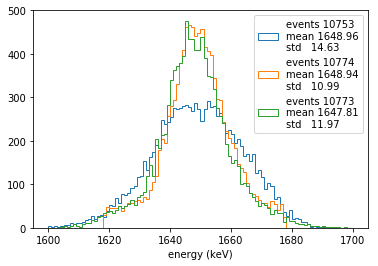

In [139]:
erange = (1600., 1700.)
#erange = (2500., 2900.)
ut.hist(sdf.energy.values, 100, erange);
ut.hist(sdf.ecln  .values, 100, erange, fig = False);
ut.hist(sdf.ecc   .values, 100, erange, fig = False);
plt.xlabel('energy (keV)');

energy resolution =   2.14 FWHM
energy resolution =   1.32 FWHM
energy resolution =   1.37 FWHM


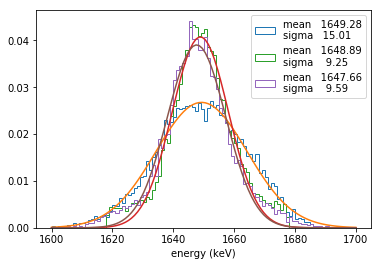

In [140]:
erange = (1600., 1700.)
#erange = (1630., 1670.)
ut.plot_energy_resolution(sdf.energy.values, 100, erange);
ut.plot_energy_resolution(sdf.ecln  .values, 100, erange);
ut.plot_energy_resolution(sdf.ecc   .values, 100, erange);
plt.xlabel('energy (keV)');

## Correlations

In [141]:
print(list(sdf.columns))

['event', 'trackID', 'energy', 'length', 'numb_of_voxels', 'numb_of_hits', 'numb_of_tracks', 'x_min', 'y_min', 'z_min', 'x_max', 'y_max', 'z_max', 'r_max', 'x_ave', 'y_ave', 'z_ave', 'extreme1_x', 'extreme1_y', 'extreme1_z', 'extreme2_x', 'extreme2_y', 'extreme2_z', 'blob1_x', 'blob1_y', 'blob1_z', 'blob2_x', 'blob2_y', 'blob2_z', 'eblob1', 'eblob2', 'ovlp_blob_energy', 'vox_size_x', 'vox_size_y', 'vox_size_z', 'time', 'S2e0', 'S2q0', 'S1e', 'ntrks', 'nS2', 'qe0', 'fec', 'dz', 'dx', 'dy', 'zmed', 'ecln', 'dzb', 'adzb', 'brat', 'et1', 'et2', 'fzb', 'ei', 'er', 'ee', 'eif', 'ecc', 'qcc', 'qec']


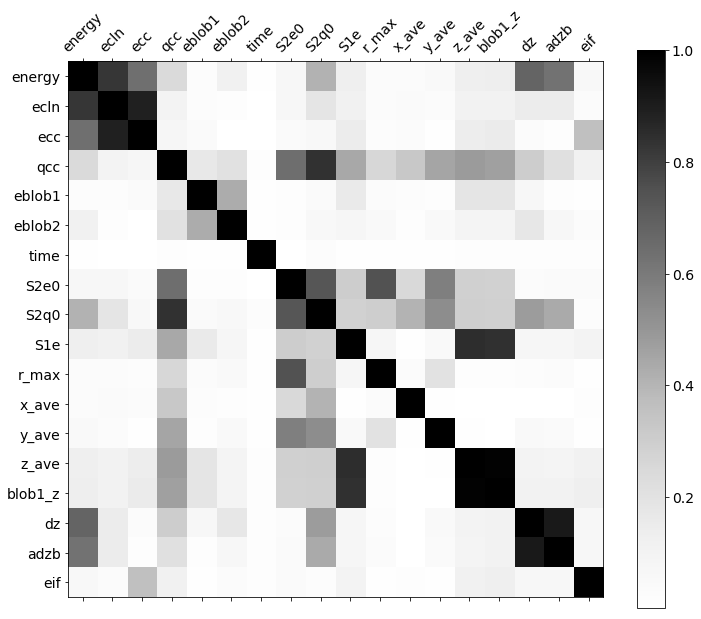

In [142]:
labels = ['energy', 'ecln', 'ecc', 'qcc', 'eblob1', 'eblob2', 'time', 
          'S2e0', 'S2q0', 'S1e','r_max', 'x_ave', 'y_ave', 'z_ave', 
          'blob1_z', 'dz', 'adzb', 'eif'] 
ut.plot_corrmatrix(sdf, labels);

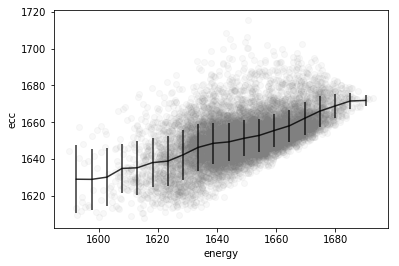

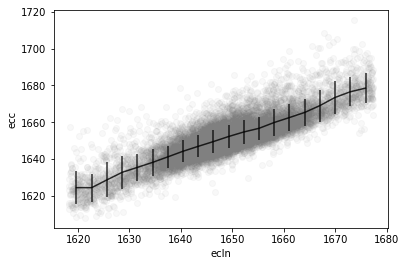

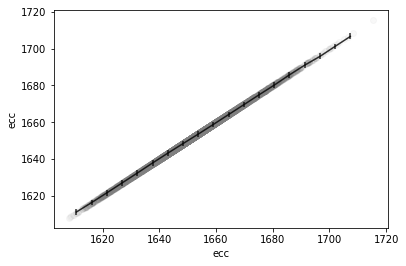

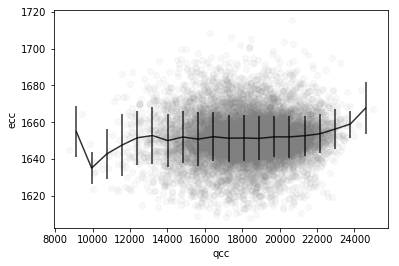

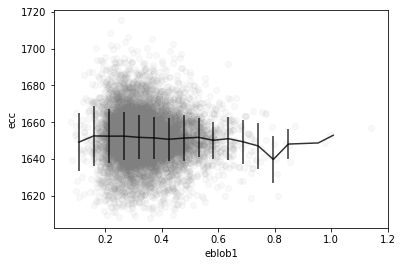

...

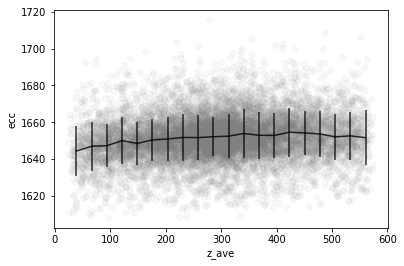

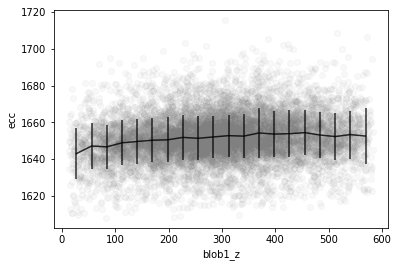

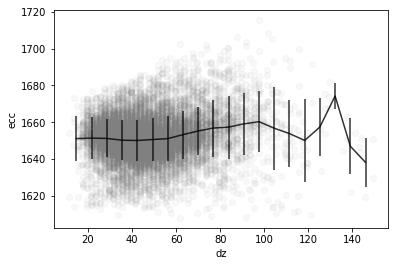

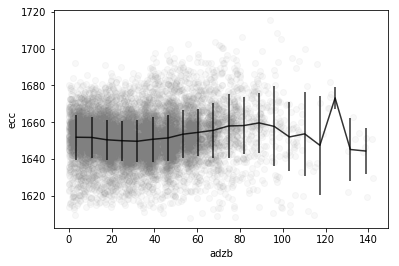

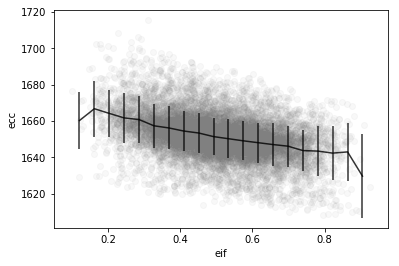

In [127]:
ut.inspect_corr('ecc', sdf, labels, alpha = alpha, nbins_profile = 20, c = 'grey');

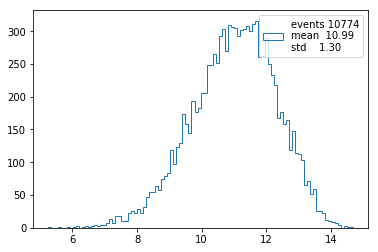

In [114]:
ut.hist(sdf.qcc/sdf.ecc, 100);

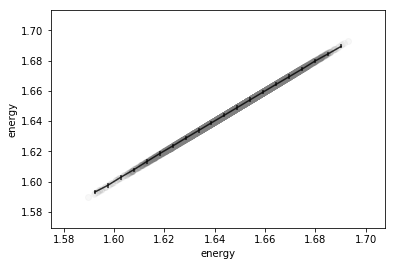

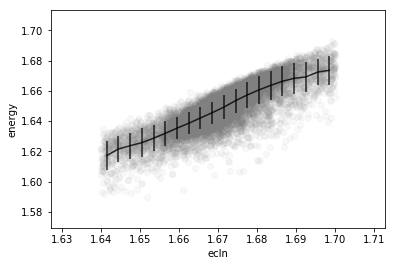

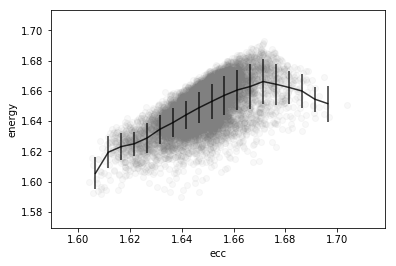

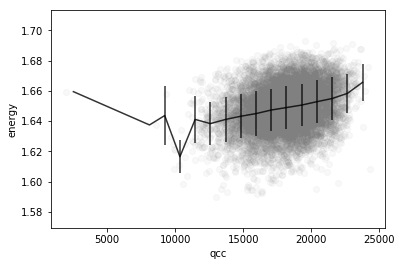

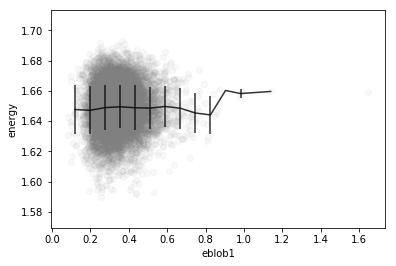

...

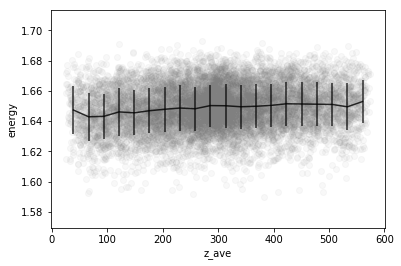

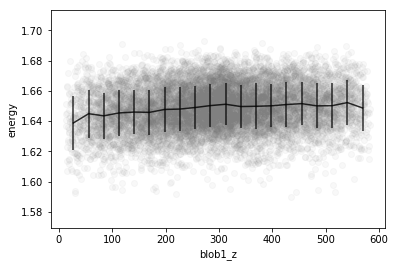

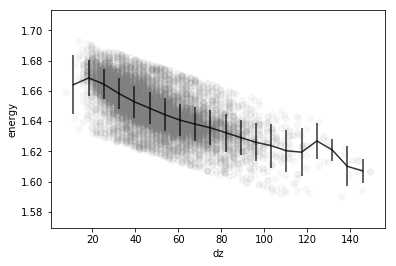

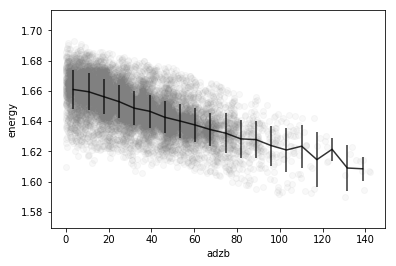

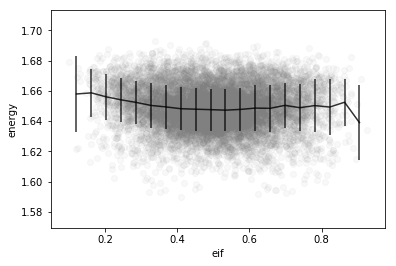

In [33]:
ut.inspect_corr('energy', sdf, labels, alpha = alpha, nbins_profile = 20, c = 'grey');

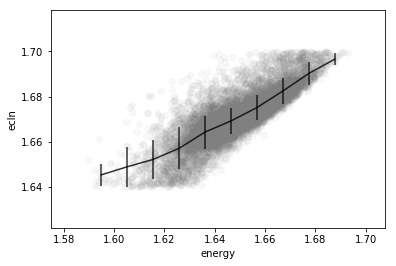

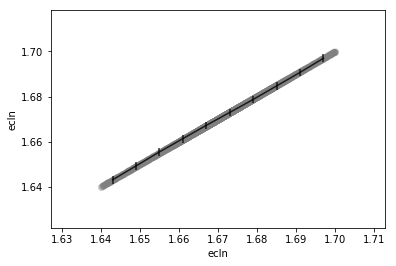

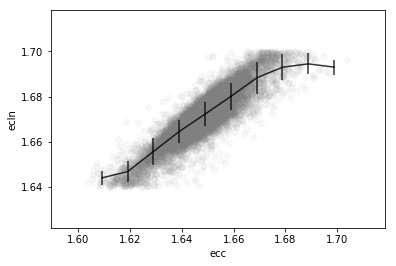

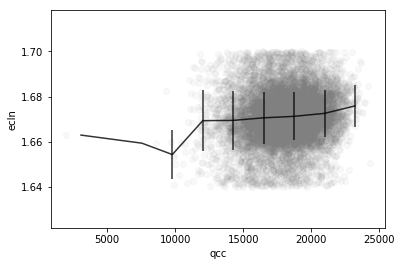

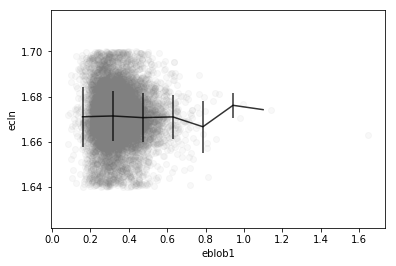

...

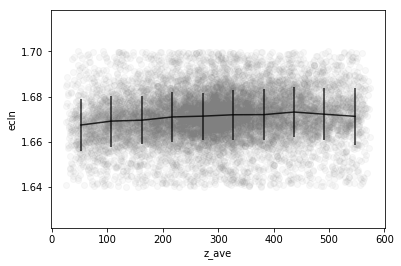

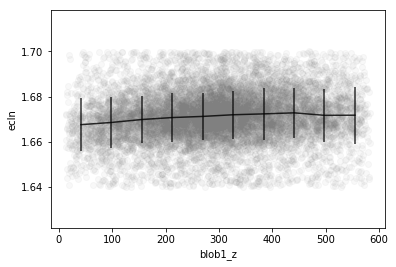

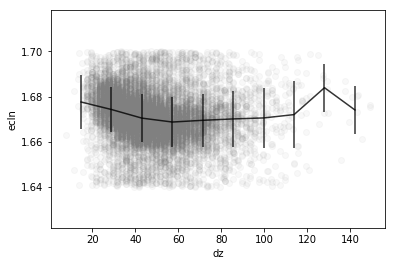

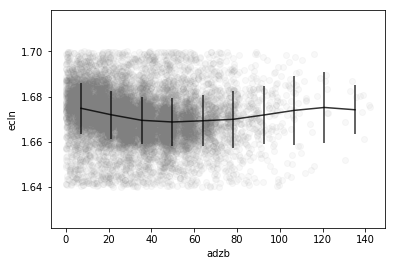

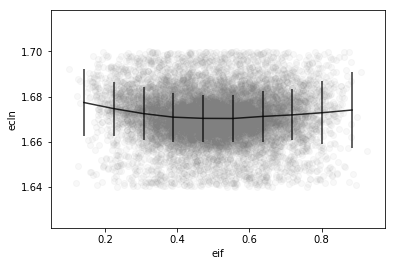

In [34]:
ut.inspect_corr('ecln', sdf, labels, alpha = alpha, nbins_profile = 20, c = 'grey');

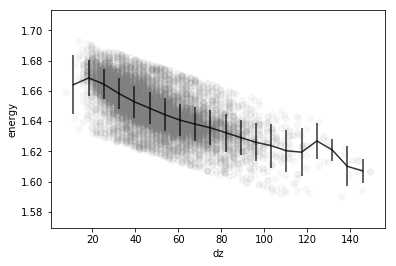

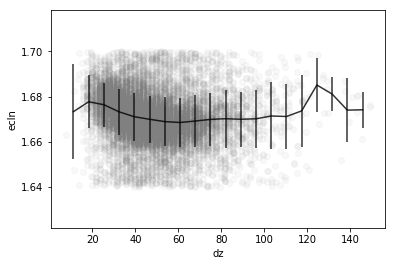

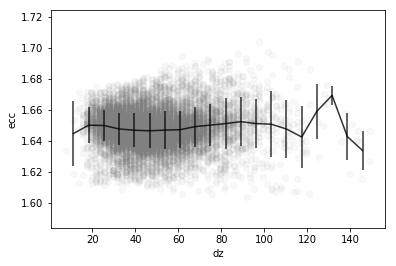

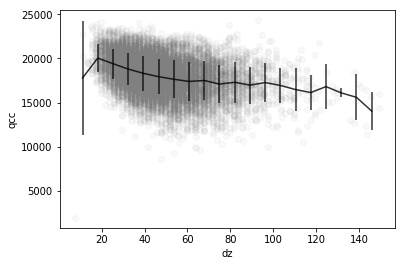

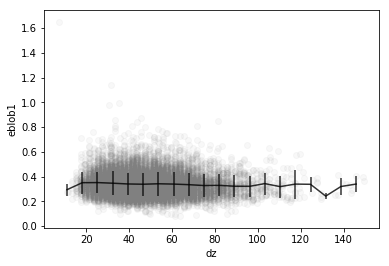

...

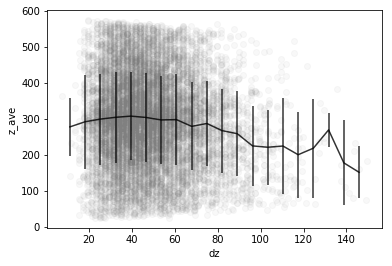

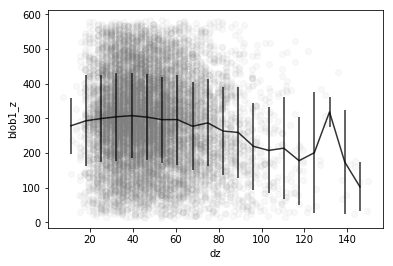

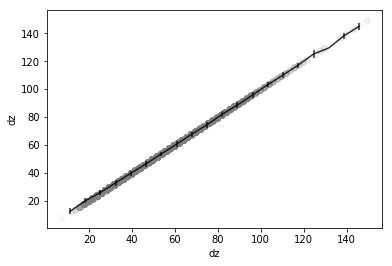

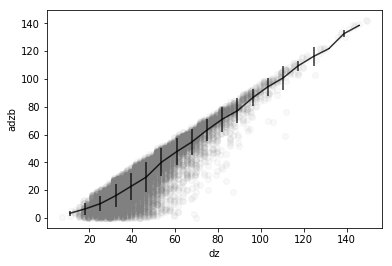

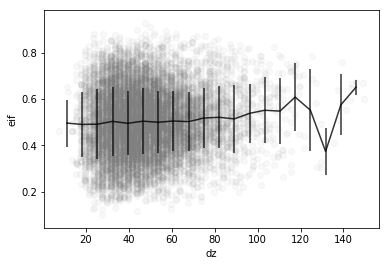

In [36]:
ut.inspect_corr('dz', sdf, labels = labels, reverse = True, nbins_profile = 20, alpha = alpha, c = 'grey');

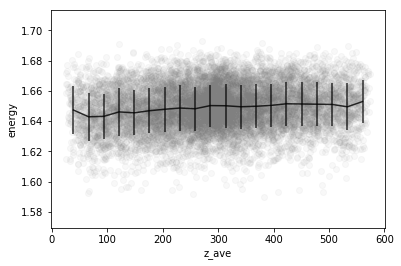

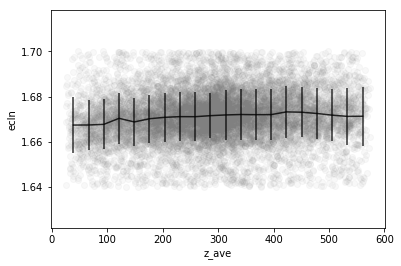

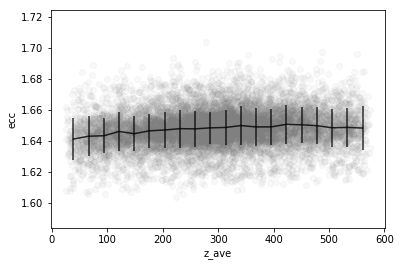

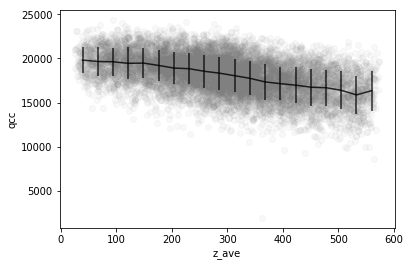

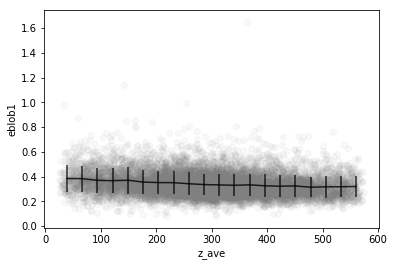

...

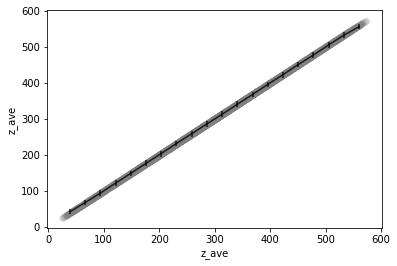

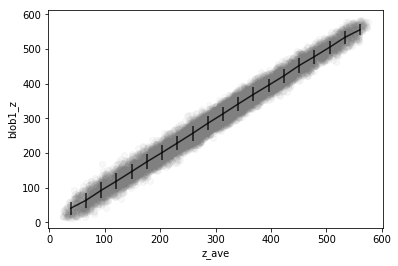

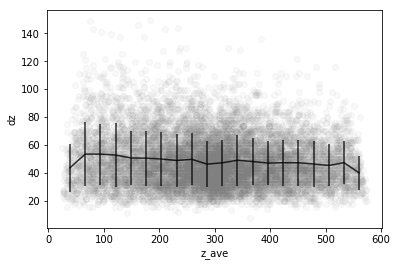

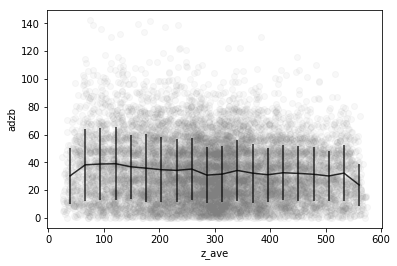

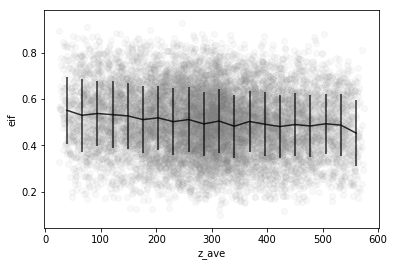

In [37]:
ut.inspect_corr('z_ave', sdf, labels = labels, reverse = True, alpha = alpha, nbins_profile = 20, c = 'grey');

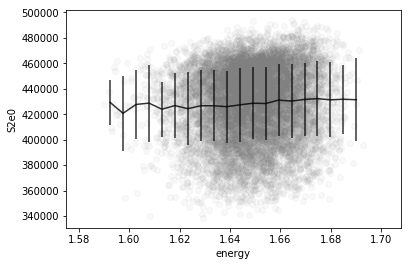

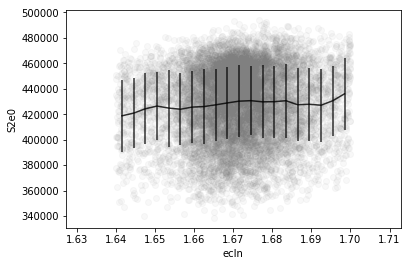

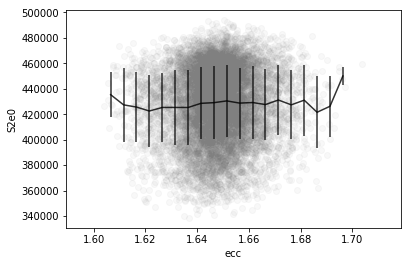

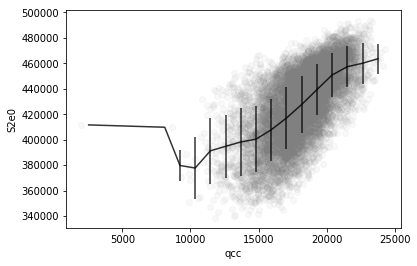

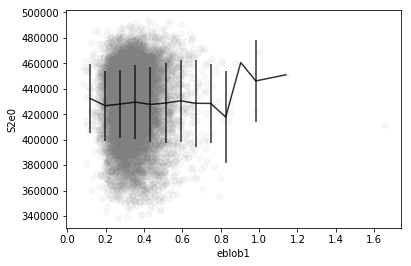

...

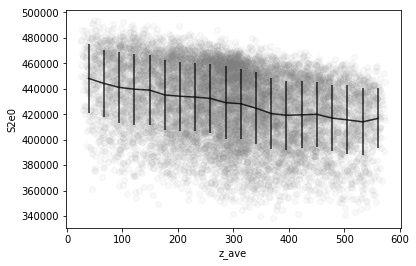

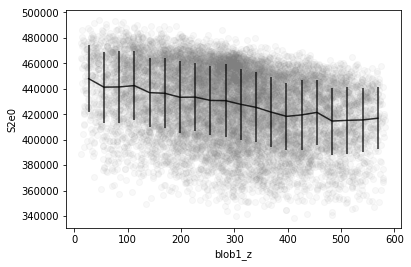

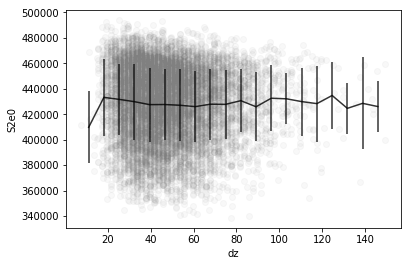

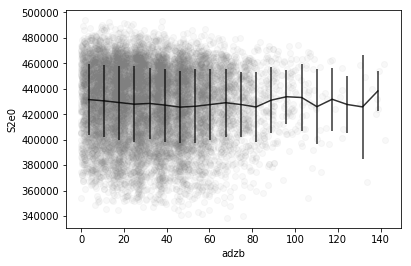

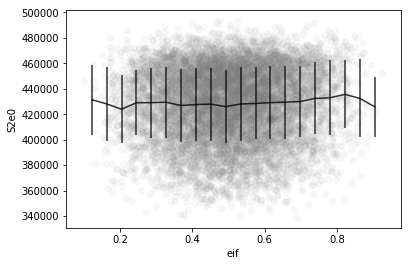

In [40]:
ut.inspect_corr('S2e0', sdf, labels = labels, alpha = alpha, nbins_profile = 20, c = 'grey');

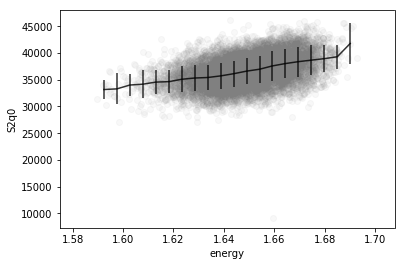

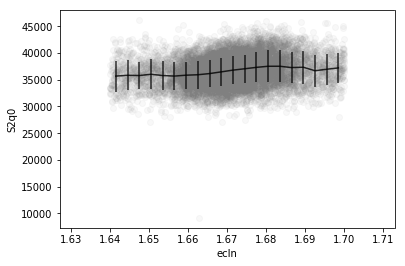

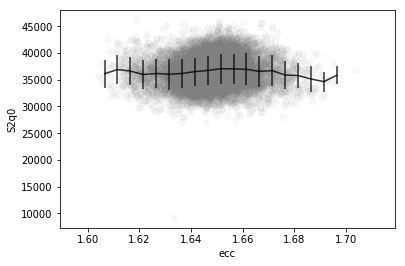

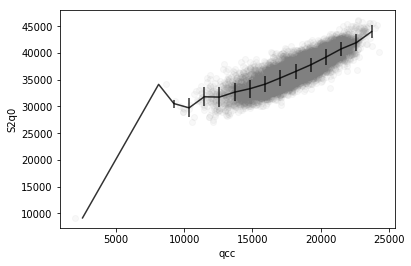

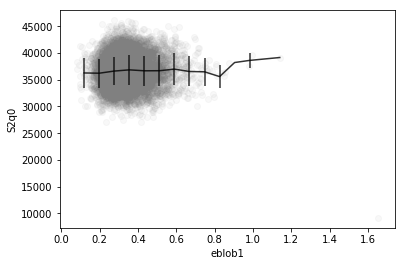

...

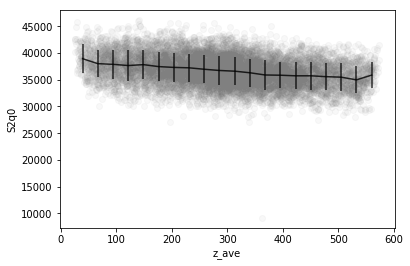

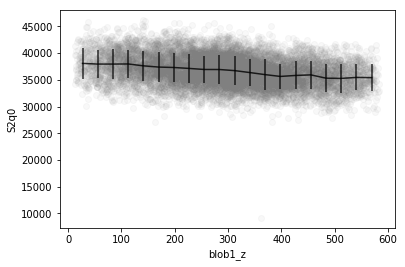

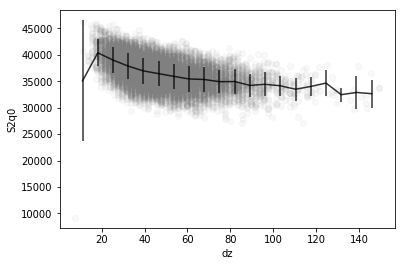

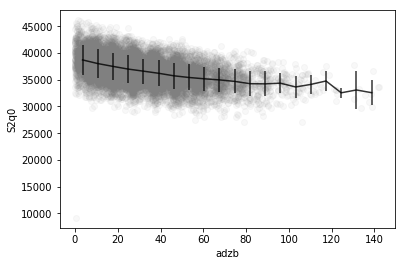

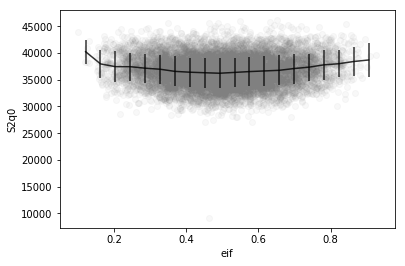

In [41]:
ut.inspect_corr('S2q0', sdf, labels = labels, alpha = alpha, nbins_profile = 20, color = 'grey');

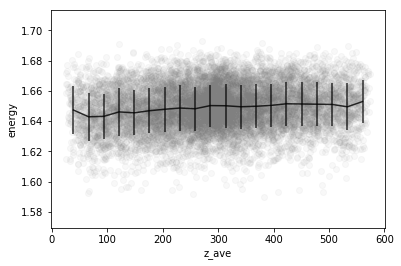

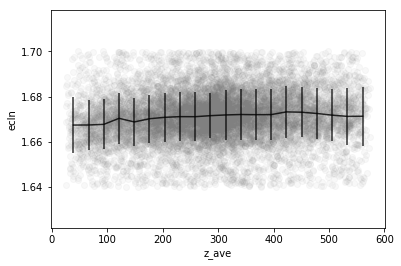

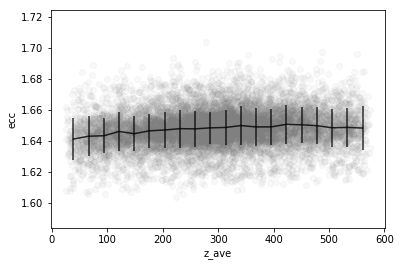

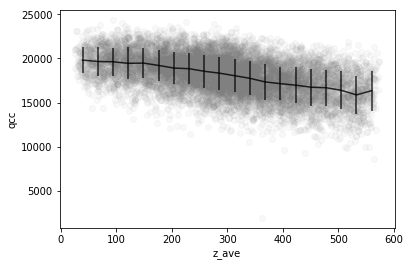

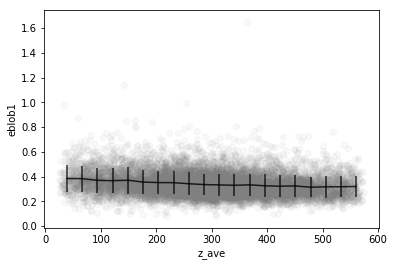

...

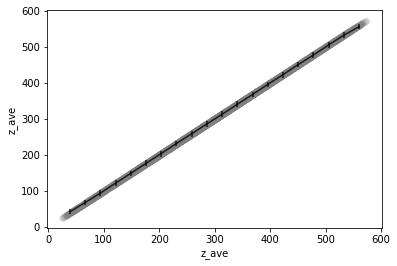

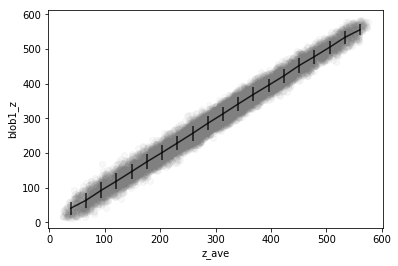

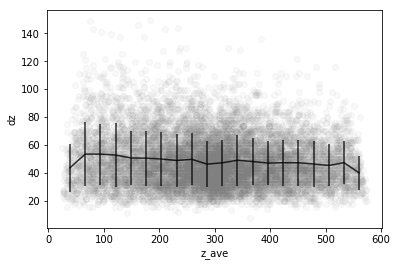

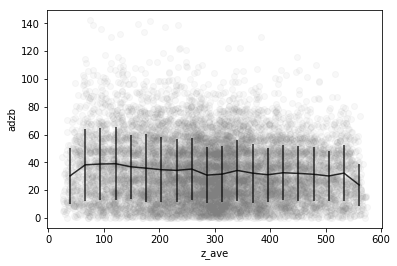

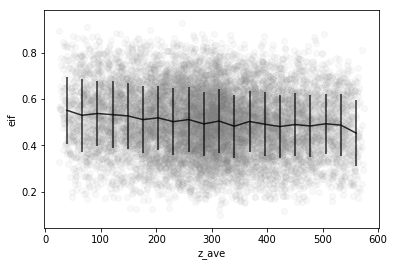

In [42]:
ut.inspect_corr('z_ave', sdf, labels = labels, reverse = True, alpha = alpha, nbins_profile = 20, color = 'grey');

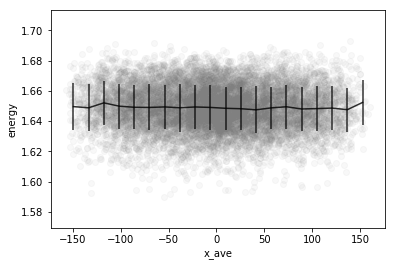

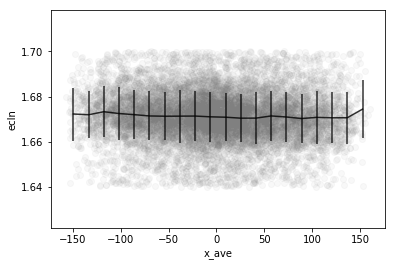

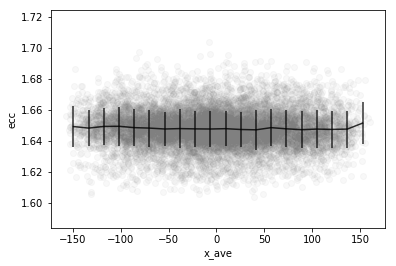

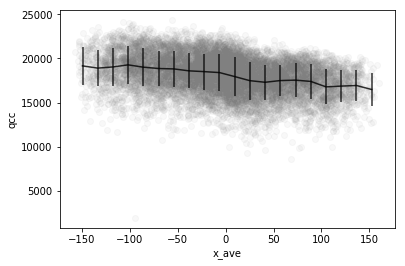

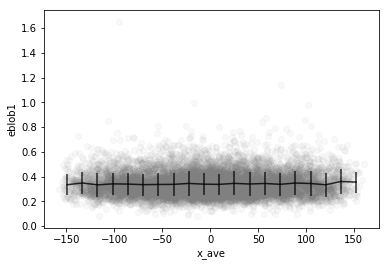

...

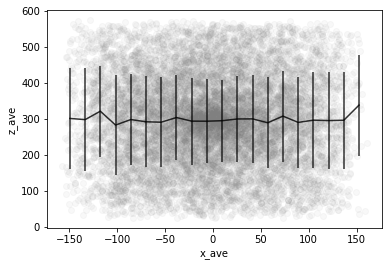

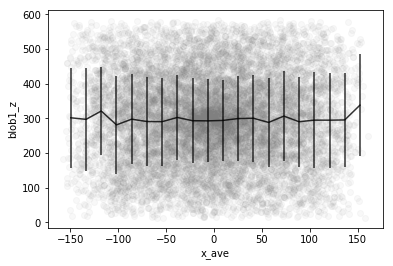

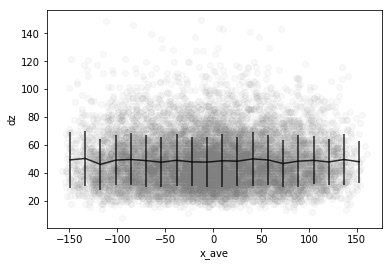

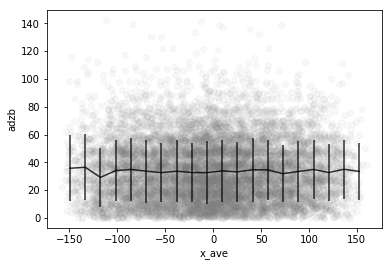

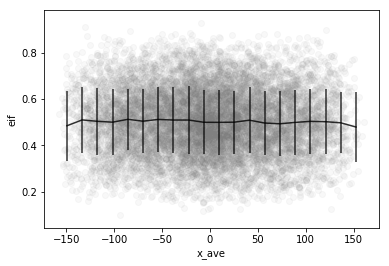

In [43]:
ut.inspect_corr('x_ave', sdf, labels = labels, reverse = True, alpha = alpha, nbins_profile = 20, color = 'grey');

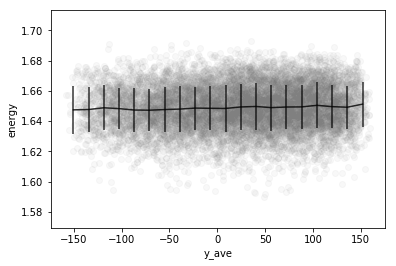

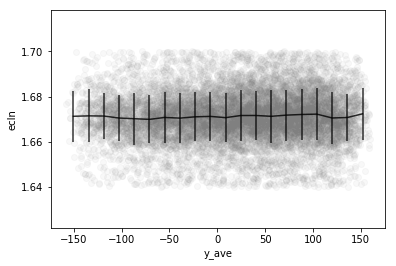

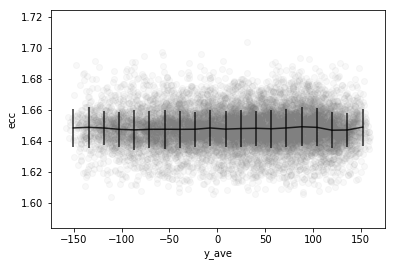

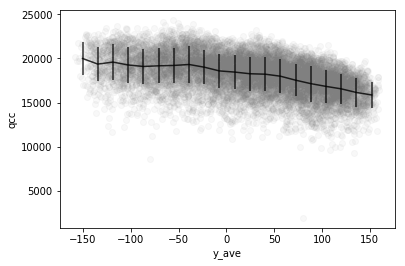

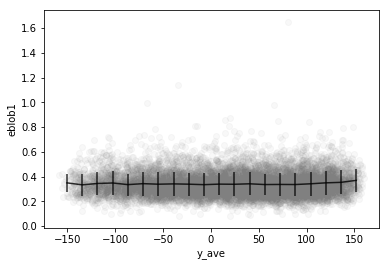

...

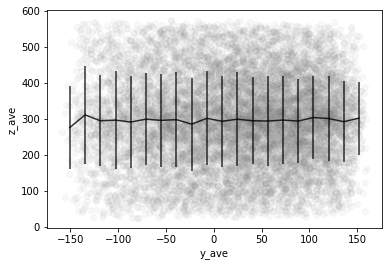

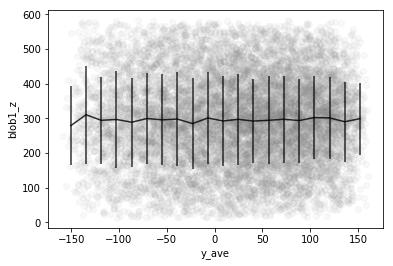

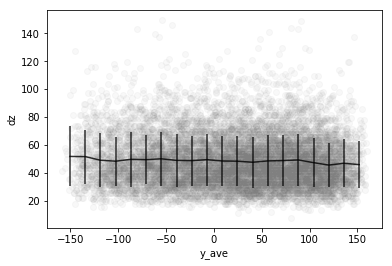

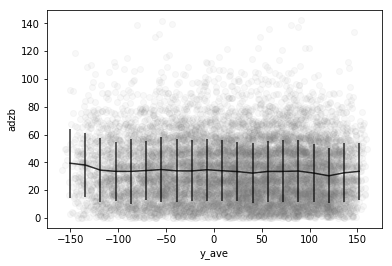

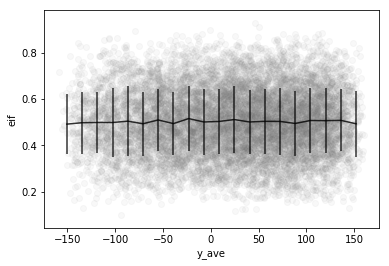

In [44]:
ut.inspect_corr('y_ave', sdf, labels = labels, reverse = True, alpha = alpha, nbins_profile = 20, color = 'grey');

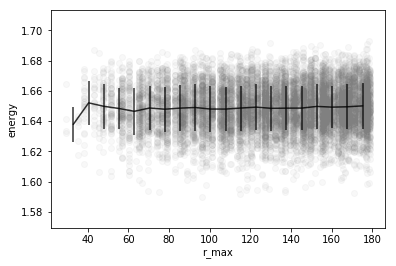

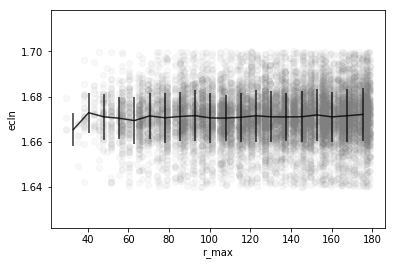

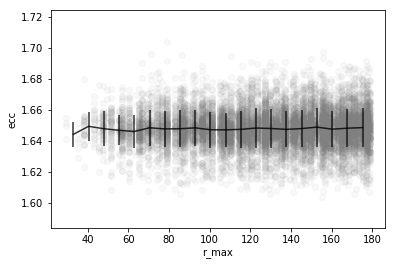

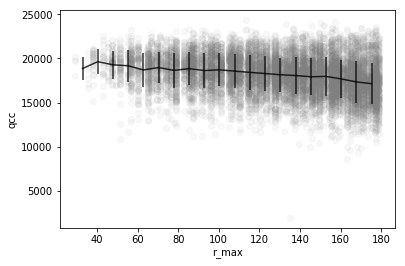

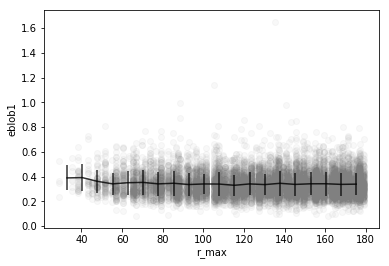

...

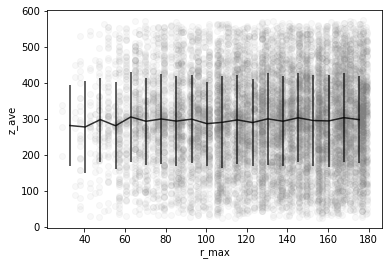

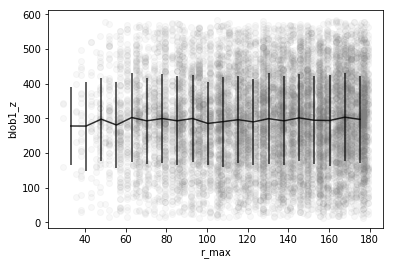

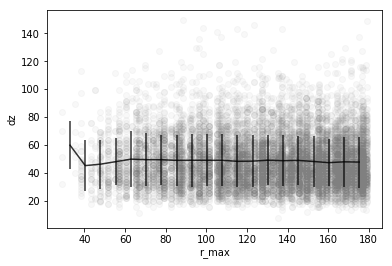

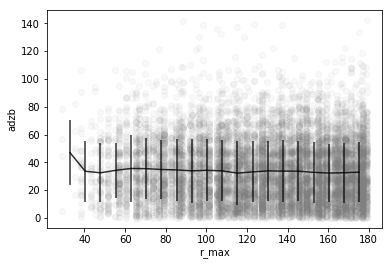

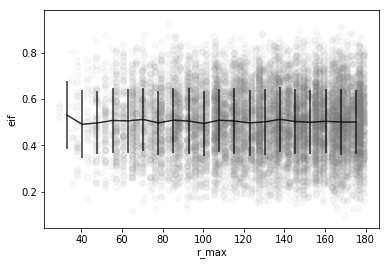

In [45]:
ut.inspect_corr('r_max', sdf, labels = labels, reverse = True, alpha = alpha, nbins_profile = 20,  c = 'grey');

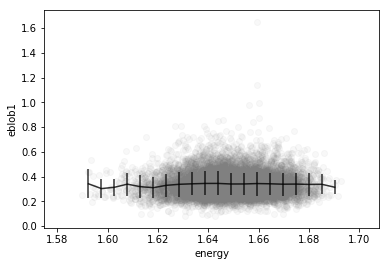

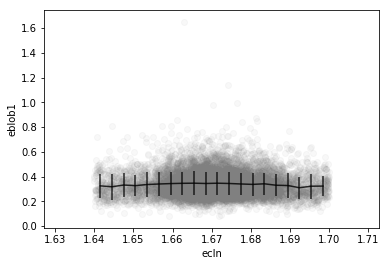

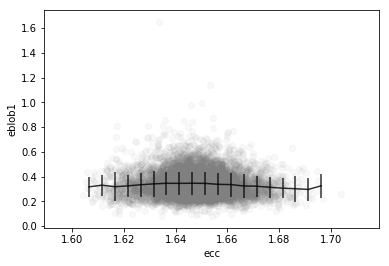

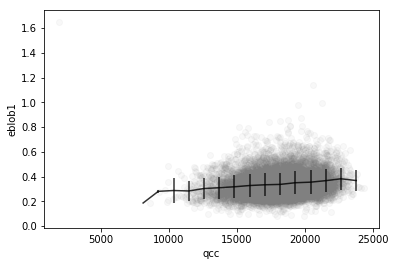

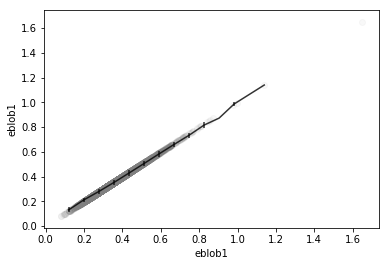

...

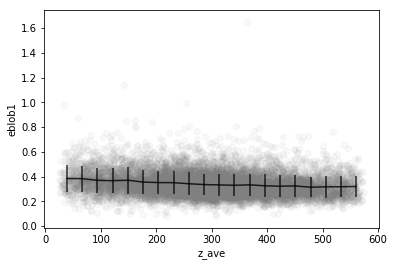

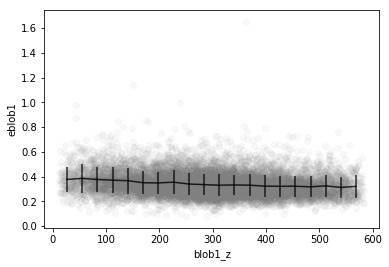

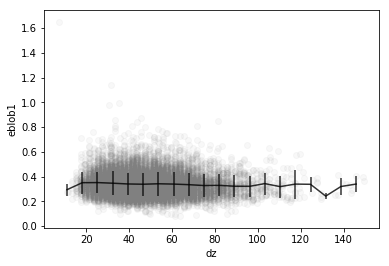

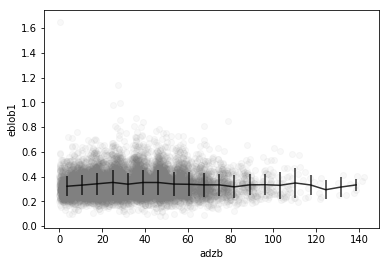

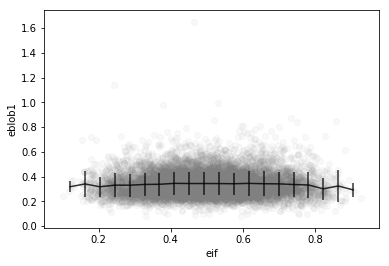

In [46]:
ut.inspect_corr('eblob1', sdf, labels = labels, reverse = False, alpha = alpha, nbins_profile = 20, c = 'grey');

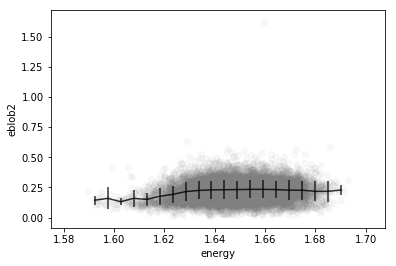

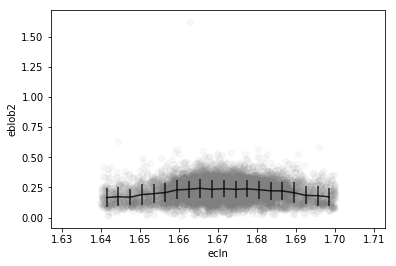

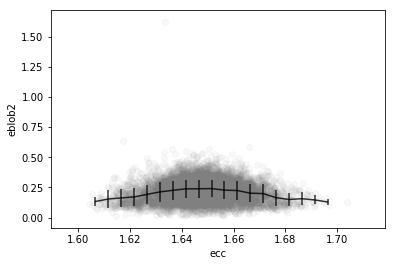

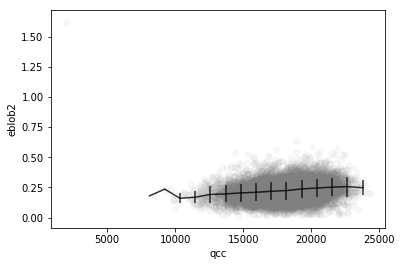

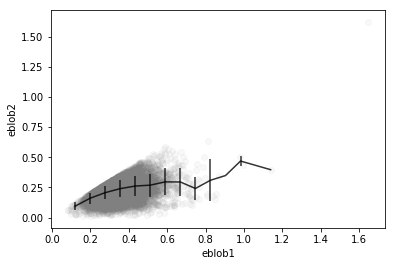

...

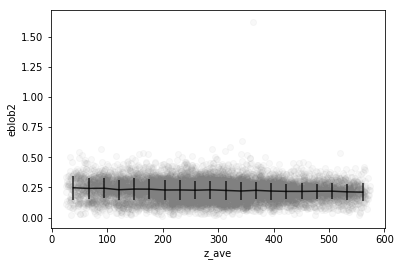

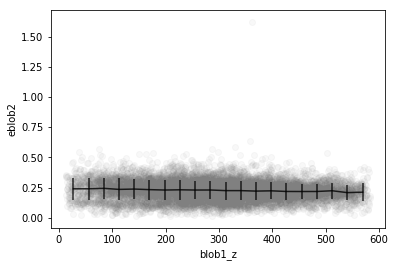

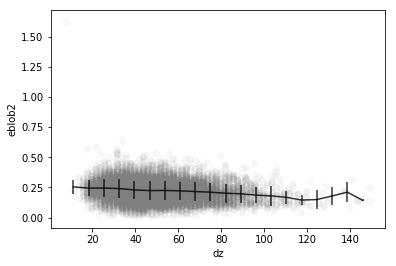

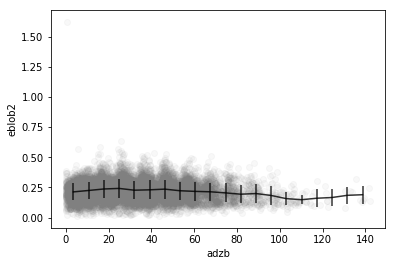

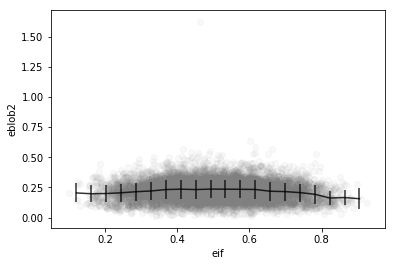

In [47]:
ut.inspect_corr('eblob2', sdf, labels = labels, reverse = False, alpha = alpha, nbins_profile = 20,  c = 'grey');

[-2.14159409e-01  1.64934366e+03]


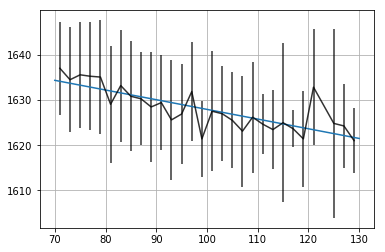

In [53]:
dz, ene = sdf.dz.values, 1000.*sdf.energy.values
nbins   = 30
dzrange = (70., 130.)
#dzrange = (100., 10.)
erange  = (1600., 1800.)
ut.hprofile(dz, ene, urange = dzrange, vrange = erange, nbins_profile = nbins);
#ut.hprofile(dz, ene, nbins_profile = nbins);
plt.grid();
pars, errs = ut.hlinefit(dz, ene, nbins, dzrange, erange); 
xs = np.linspace(*dzrange, nbins);
ys = [ut.fline(xi, *pars) for xi in xs]
plt.plot(xs, ys);
print(pars)
#yslope = (2755. - 2725.) /(58.-25.)
#print("slope {:5.2f} keV/mm".format(yslope), 1670.- 1640., 58. - 20.);

## With the corrections

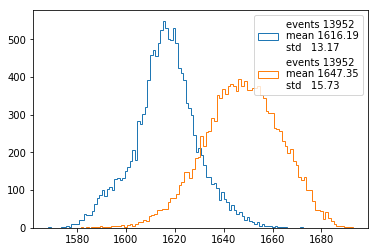

In [54]:
ut.hist(1000.*0.9815*df.ecc, 100);
ut.hist(1000.*df.energy, 100, fig = False);

##### HERE

In [55]:
#inspect(dfptracks)

In [56]:
#inspect(dfpsumm)

In [57]:
#inspect(dfpevts)

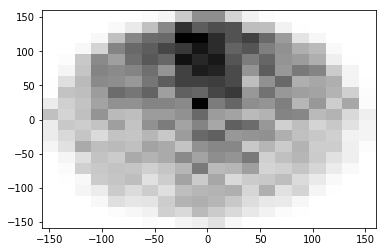

In [58]:
plt.hist2d(sdf.x_ave, sdf.y_ave, 20, cmap = 'Greys');

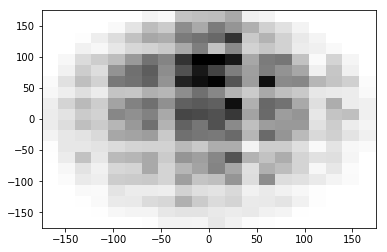

In [59]:
plt.hist2d(sdf.blob1_x, sdf.blob1_y, 20, cmap = 'Greys');

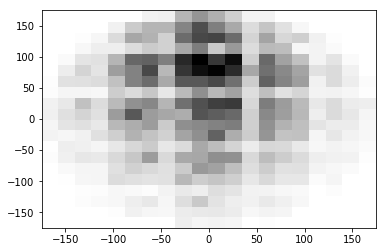

In [60]:
plt.hist2d(sdf.blob2_x, sdf.blob2_y, 20, cmap = 'Greys');

In [143]:
def updown(sdf):
    sela = (sdf.y_min > 0.)
    selb = (sdf.y_max < 0.)
    return (sela, selb)

def rightleft(sdf):
    sela = (sdf.x_min > 0.)
    selb = (sdf.x_max < 0.)
    return (sela, selb)

def corona(sdf):
    r_ave   = np.sqrt(sdf.x_ave * sdf.x_ave + sdf.y_ave * sdf.y_ave)
    sela = (r_ave <= 100.)
    selb = (r_ave >  100.)
    return (sela, selb)

def zzones(sdf):
    sela = (sdf.z_min > 0.)   & (sdf.z_max < 200.)
    selb = (sdf.z_min > 200.) & (sdf.z_max < 400.)
    selc = (sdf.z_min > 400.) & (sdf.z_max < 600.)
    return (sela, selb, selc)

def dzzones(sdf):
    z0 = np.percentile(sdf.dz, 33.)
    z1 = np.percentile(sdf.dz, 66.)
    sela = (sdf.dz <= z0)
    selb = (sdf.dz > z0)  & (sdf.dz <= z1)
    selc = (sdf.dz > z1)
    return (sela, selb, selc)

def b1zones(sdf):
    z0 = np.percentile(sdf.dzb, 33.)
    z1 = np.percentile(sdf.dzb, 66.)
    sela = (sdf.dzb <= z0)
    selb = (sdf.dzb > z0)  & (sdf.dzb <= z1)
    selc = (sdf.dzb > z1)
    return (sela, selb, selc)


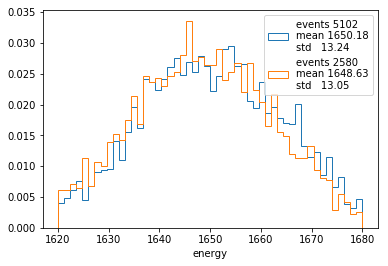

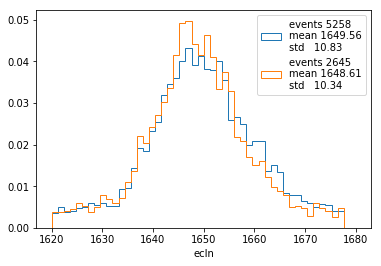

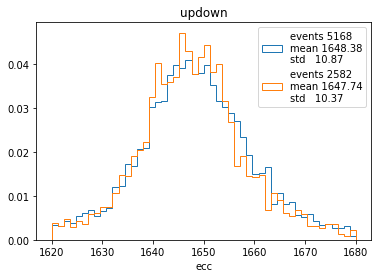

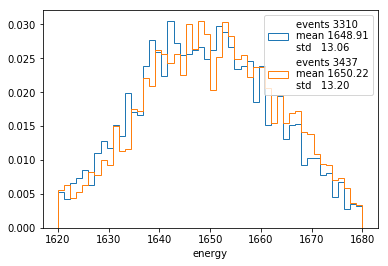

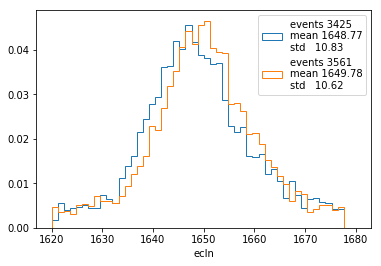

...

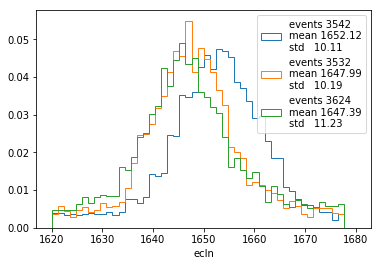

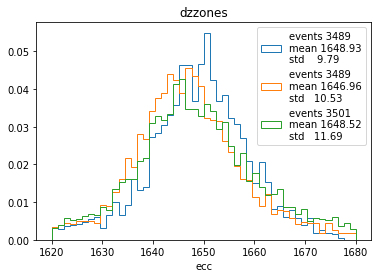

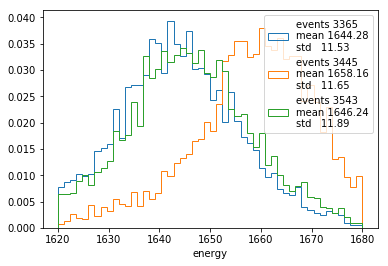

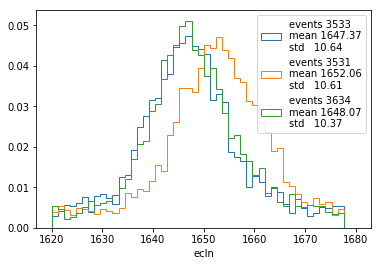

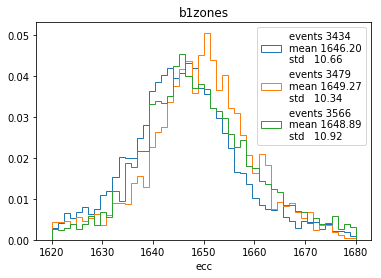

In [145]:
ilabels = ['energy', 'ecln', 'ecc']
erange  = (1620., 1680)
samples = [updown, rightleft, zzones, corona, dzzones, b1zones]
for sam in samples:
    ssam = str(sam).split()[1]
    sels = sam(sdf)
    ut.hist_sample(sdf, sels, ilabels, bins = 50, range = erange);
    plt.title(ssam)

In [71]:
ss = str(corona)
print(ss.split()[1])

corona


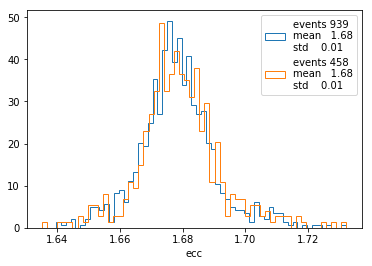

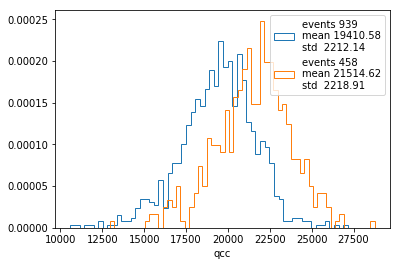

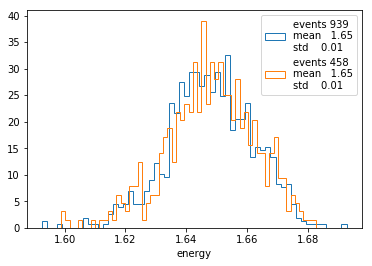

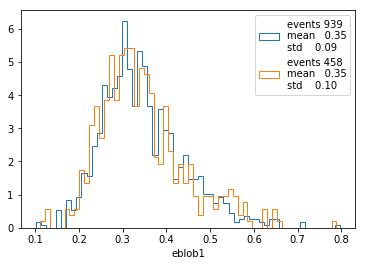

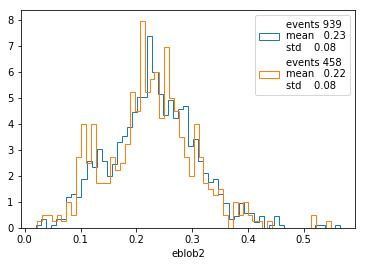

...

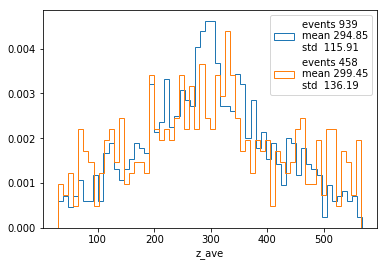

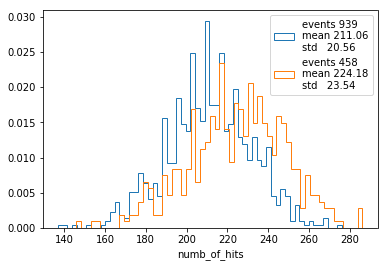

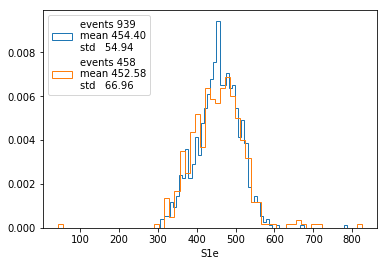

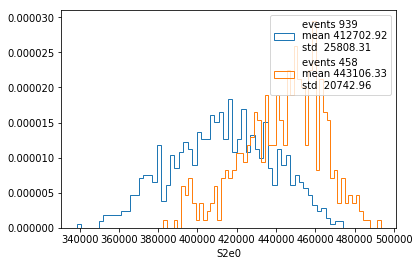

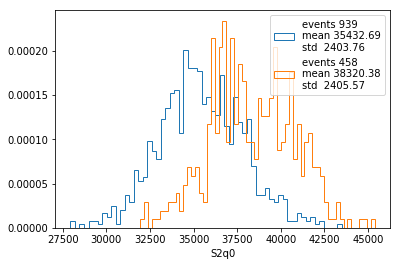

In [52]:
# contents in upper/lower part
ilabels = ['energy', 'ecc', 'ecln']
sela = (sdf.y_min > 0.)
selb = (sdf.y_max < 0.)
ilabels = ['ecc', 'qcc', 'energy', 'eblob1', 'eblob2', 'length', 'dz', 'dzb', 'z_ave',
           'numb_of_hits', 'S1e', 'S2e0', 'S2q0']
ut.hist_sample(sdf, (sela, selb), labels = ilabels);

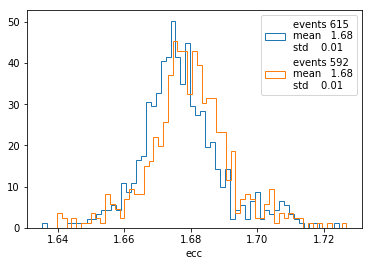

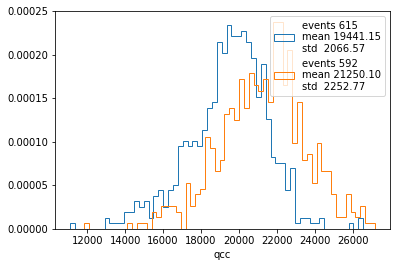

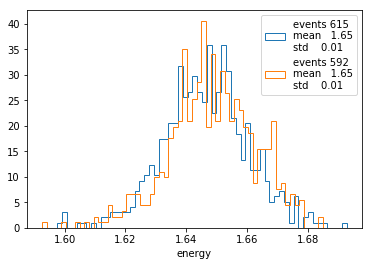

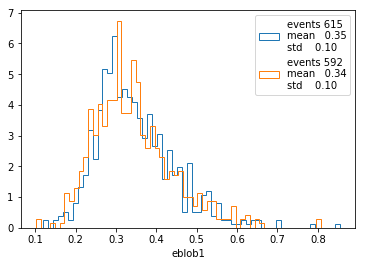

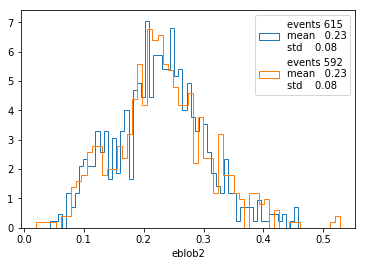

...

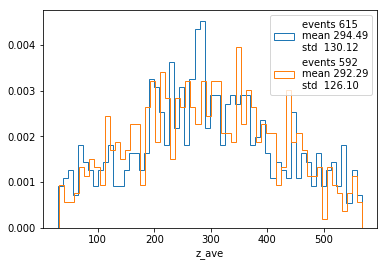

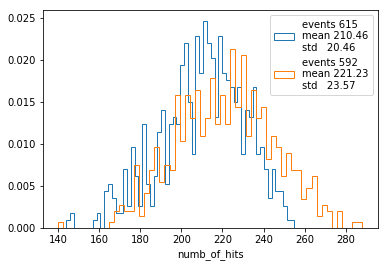

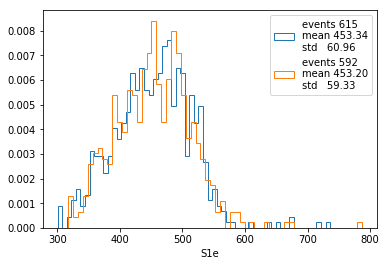

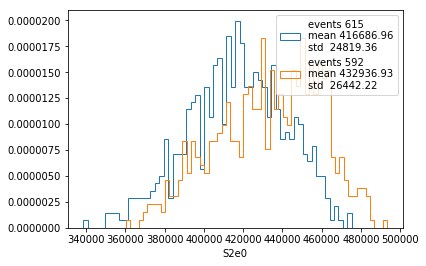

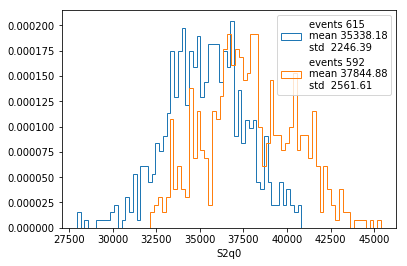

In [54]:
# track contained in left/right part of the chamber
sela = (sdf.x_min > 0.)
selb = (sdf.x_max < 0.)
ut.hist_sample(sdf, (sela, selb), labels = ilabels);

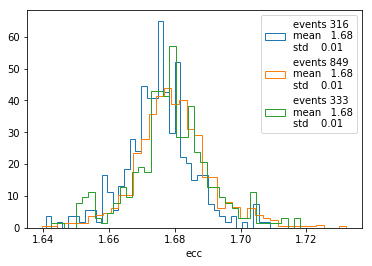

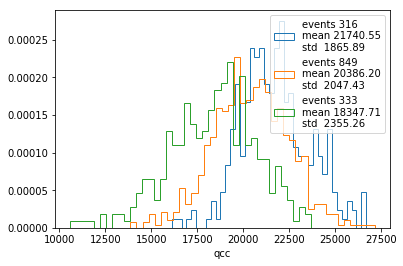

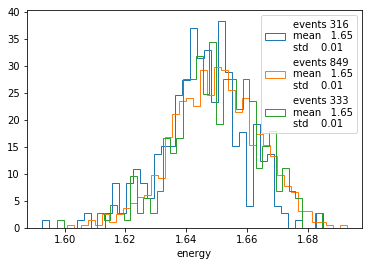

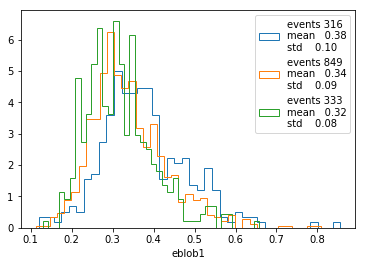

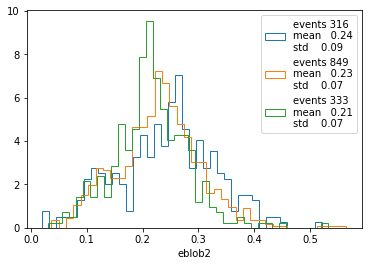

...

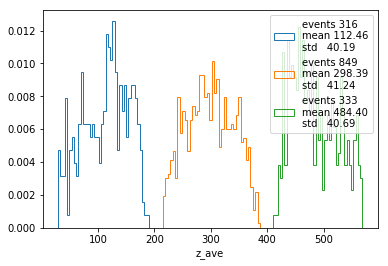

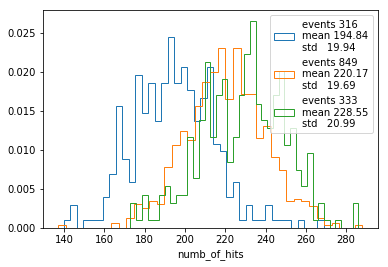

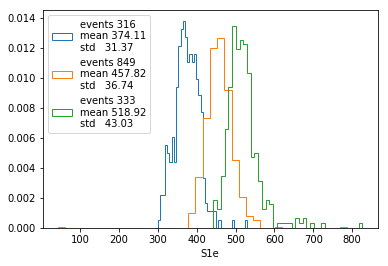

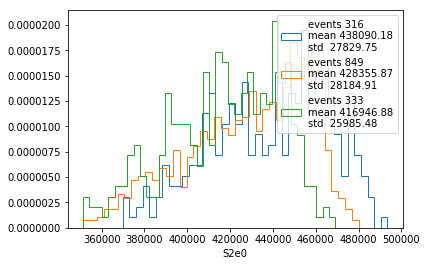

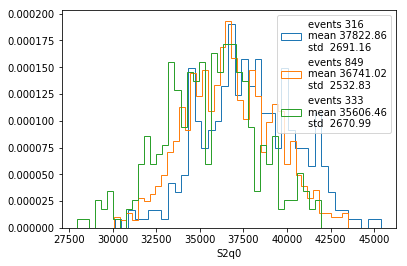

In [58]:
# tracks contained in first and last region in z of the chamber
sela = (sdf.z_min > 0.)   & (sdf.z_max < 200.)
selb = (sdf.z_min > 200.) & (sdf.z_max < 400.)
selc = (sdf.z_min > 400.) & (sdf.z_max < 600.)
ut.hist_sample(sdf, (sela, selb, selc), labels = ilabels, bins = 40);

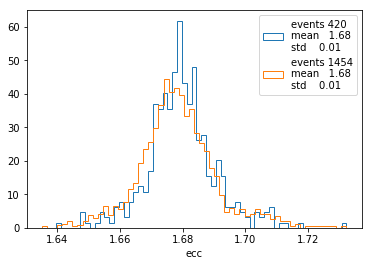

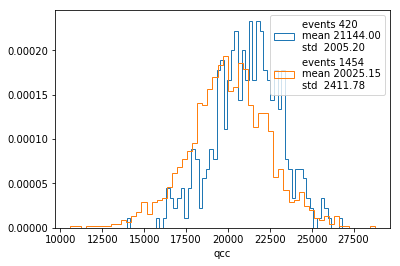

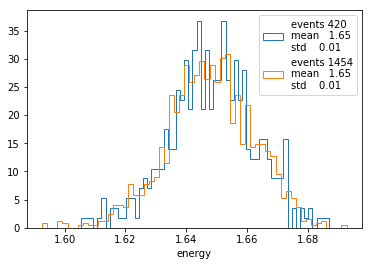

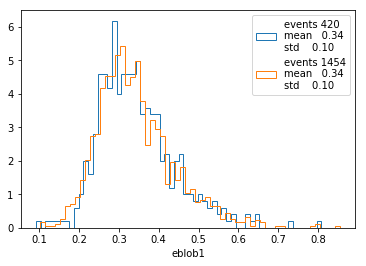

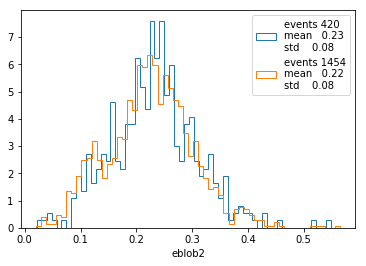

...

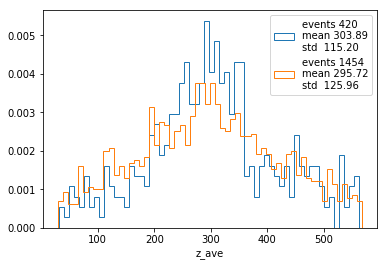

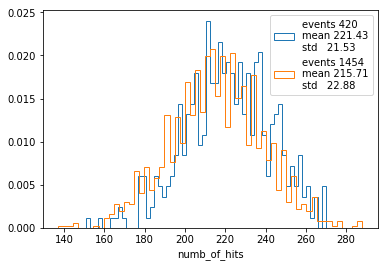

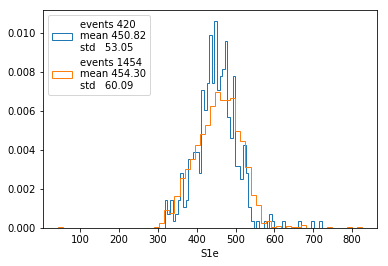

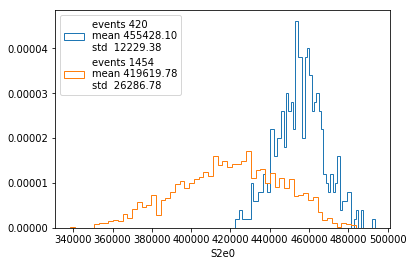

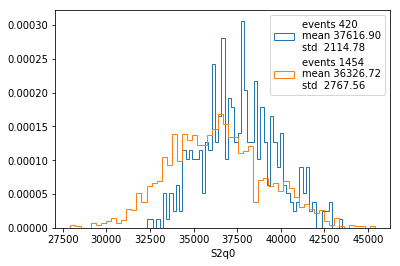

In [60]:
# track contained in center or corona of the chamber
sela = (sdf.r_max > 0.)   & (sdf.r_max < 100.)
selb = (sdf.r_max > 100.) & (sdf.r_max < 180.)
ut.hist_sample(sdf, (sela, selb), labels = ilabels);

dz ranges  39.410918124999995 51.75339375000003


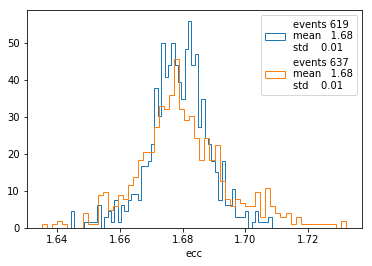

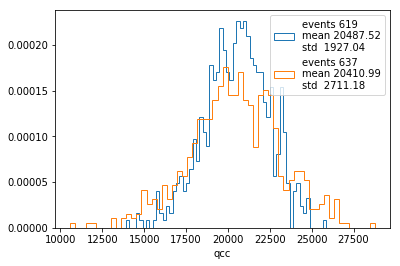

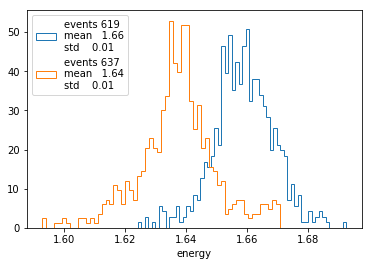

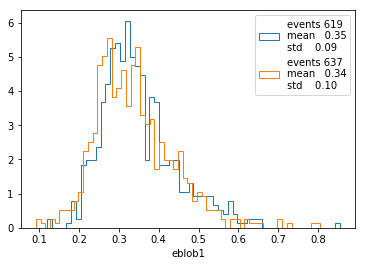

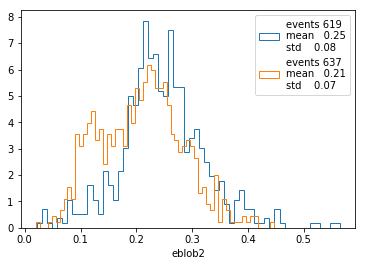

...

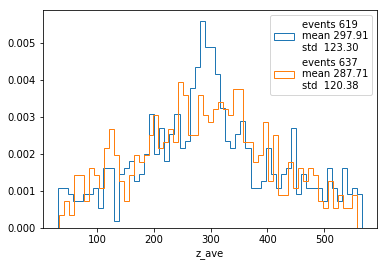

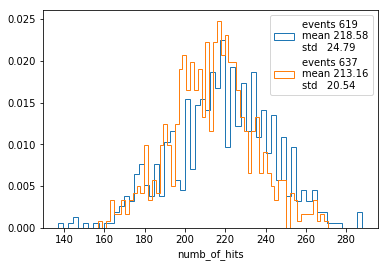

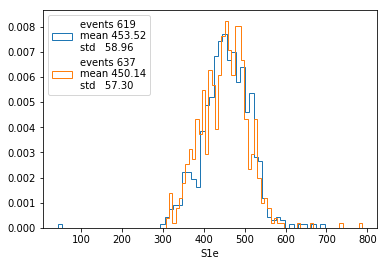

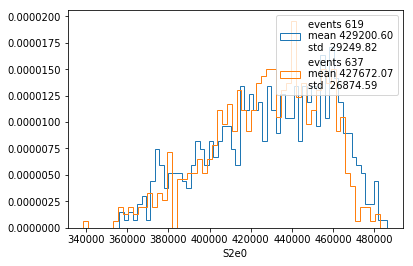

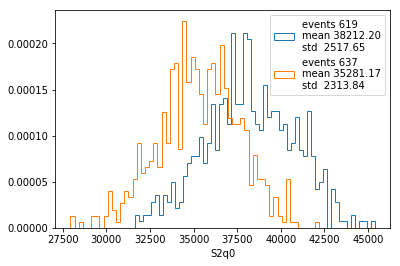

In [61]:
# short and long tracks in dz
z0 = np.percentile(sdf.dz, 33.)
z1 = np.percentile(sdf.dz, 66.)
print('dz ranges ', z0, z1)
sela = (sdf.dz  <= z0)
selb = (sdf.dz  >= z1)
ut.hist_sample(sdf, (sela, selb), labels = ilabels)

dz ranges  0.5587723807021711 0.8071652282232961


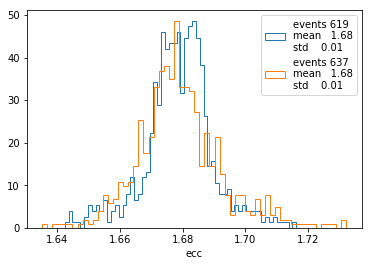

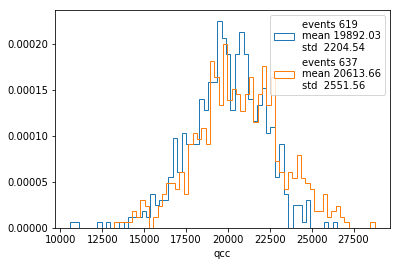

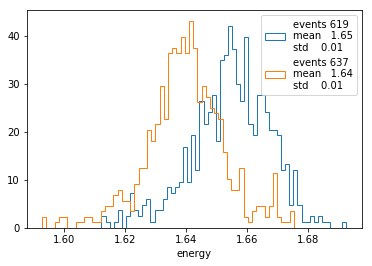

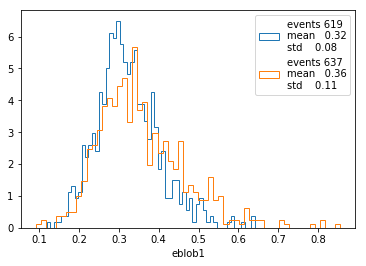

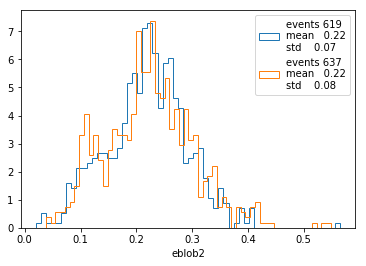

...

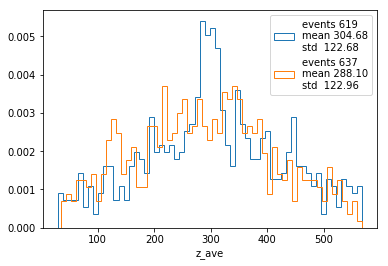

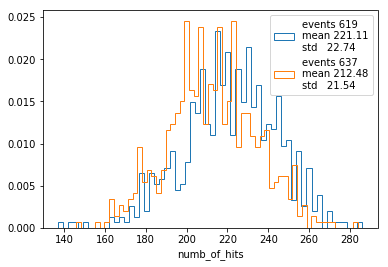

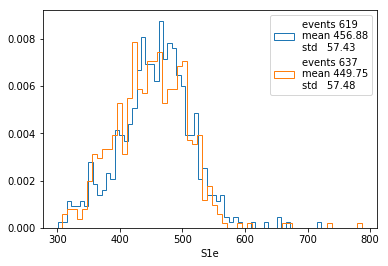

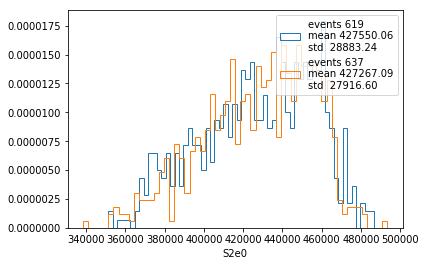

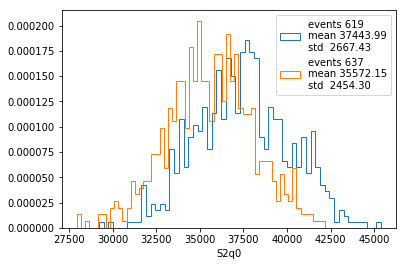

In [64]:
#z0, z1 = -25., 25.
# separation between blbos

# short and long tracks in dz
z0 = np.percentile(abs(sdf.fzb), 33.)
z1 = np.percentile(abs(sdf.fzb), 66.)
print('dz ranges ', z0, z1)
sela = (abs(sdf.fzb) <= z0)
selb = (abs(sdf.fzb) >= z1)

#z0, z1 =  25., 45.
#print('dz ranges ', z0, z1)
#sela = (abs(sdf.dzb)   < z0)
#selb = (abs(sdf.dzb)  > z1)
ut.hist_sample(sdf, (sela, selb), labels = ilabels)

In [65]:
# long dz tracks with blobs in low or high z
ksel = sdf.dz > 45.
z0 = np.percentile(sdf.fzb[ksel], 33.)
z1 = np.percentile(sdf.fzb[ksel], 66.)
print('dz ranges ', z0, z1)
sela = (sdf.fzb <= z0) & (sdf.dz > 45.)
selb = (sdf.fzb >= z1) & (sdf.dz > 45.)

dz ranges  -0.7976629514915665 0.6555210894501375


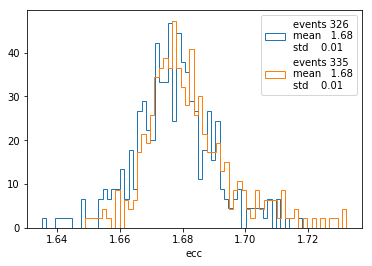

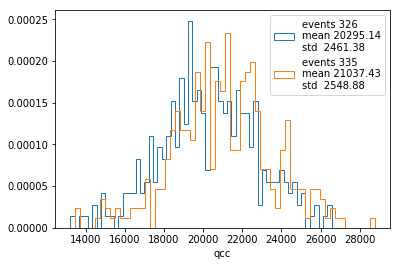

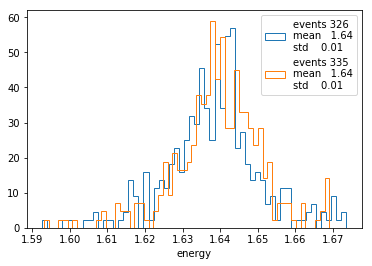

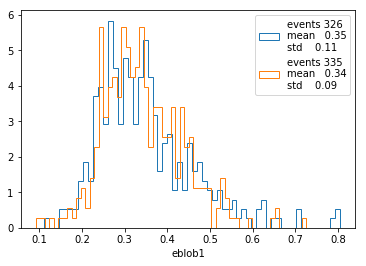

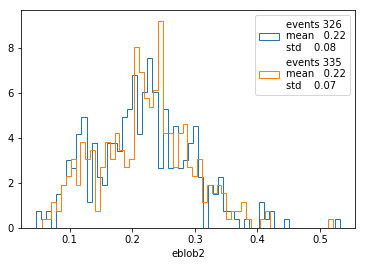

...

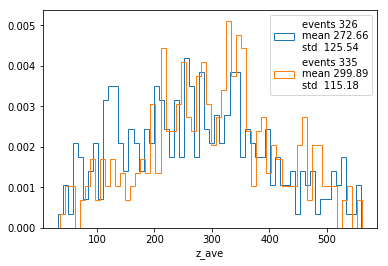

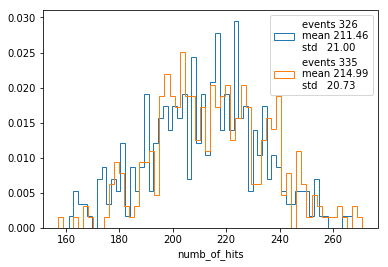

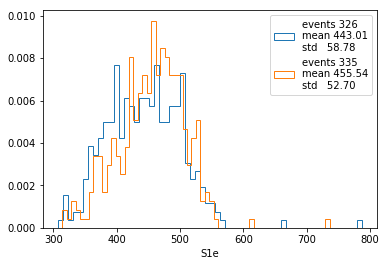

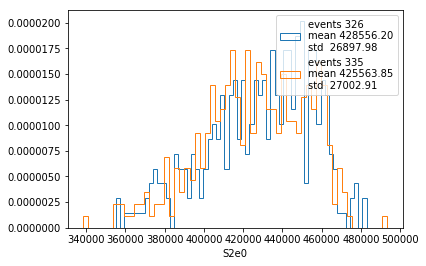

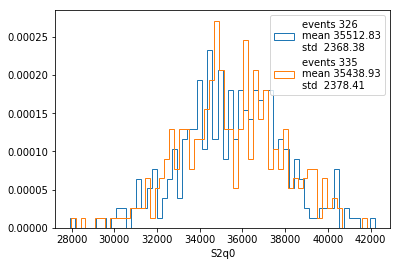

In [68]:
ut.hist_sample(sdf, (sela, selb), labels = ilabels)

## Other studies

In [69]:
# short dz tracks short and long length
ksel = sdf.dz < 45.
z0 = np.percentile(sdf[ksel].length, 33.)
z1 = np.percentile(sdf[ksel].length, 66.)
print(z0, z1)
sela = (sdf.dz < 45.) & (sdf.length <= z0)
selb = (sdf.dz < 45.) & (sdf.length >= z1)

62.7806120458291 79.7469149468883


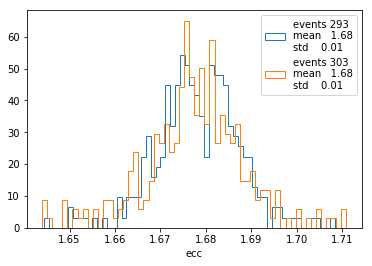

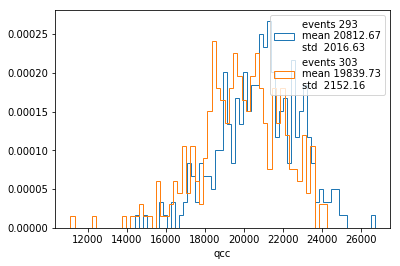

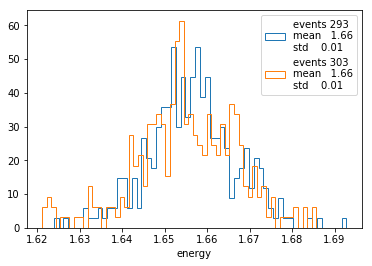

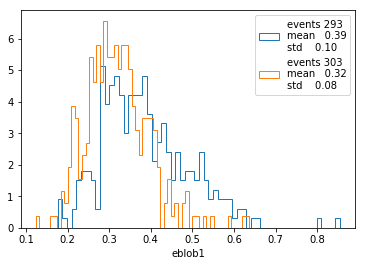

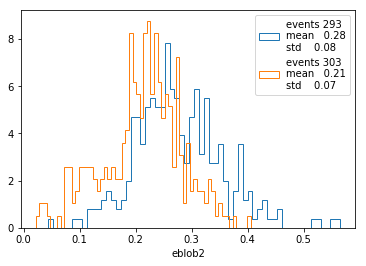

...

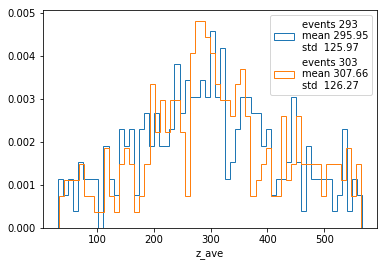

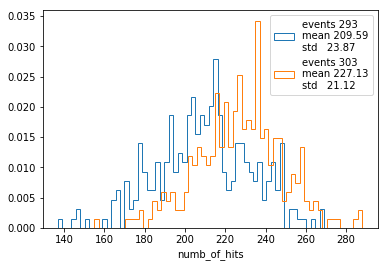

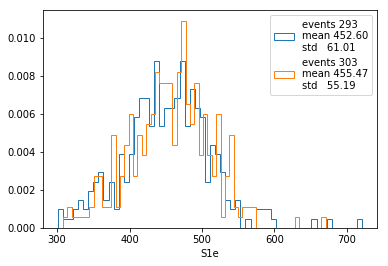

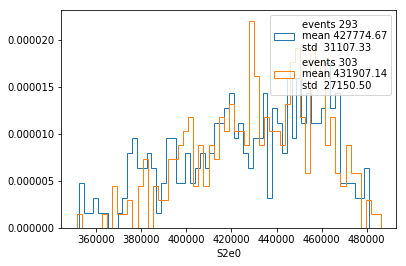

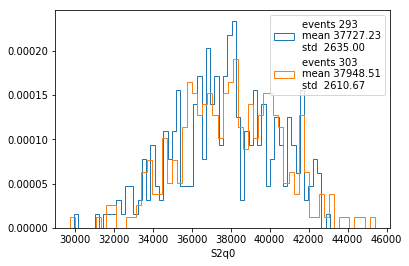

In [70]:
ut.hist_sample(sdf, (sela, selb), ilabels)

In [71]:
# long dz tracks with short and long length
ksel = sdf.dz > 45.
z0 = np.percentile(abs(sdf[ksel].length), 33.)
z1 = np.percentile(abs(sdf[ksel].length), 66.)
print(z0, z1)
sela  = (sdf.dz > 45.) & (abs(sdf.length) <= z0)
selb  = (sdf.dz > 45.) & (abs(sdf.length) >= z1)

82.42640687119999 104.92801030047062


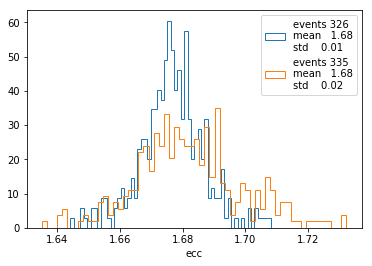

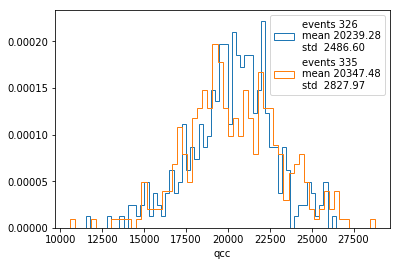

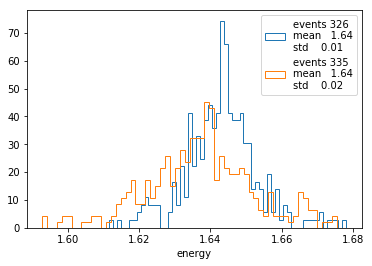

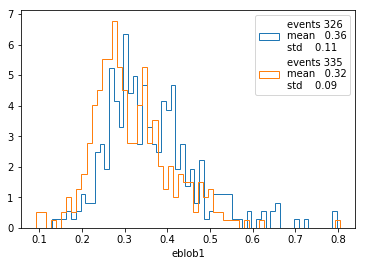

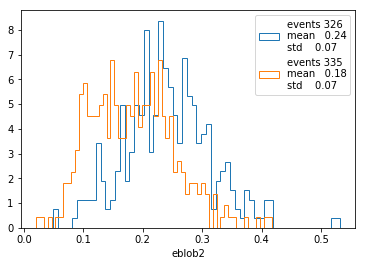

...

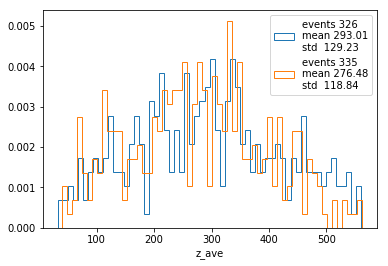

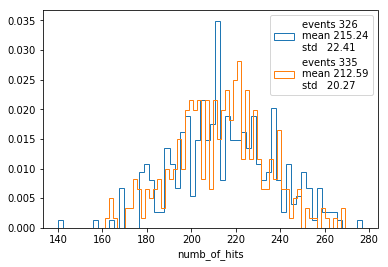

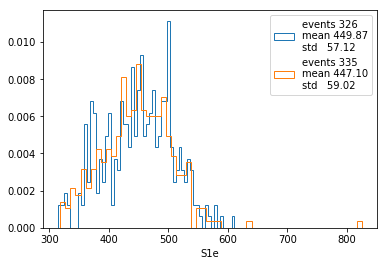

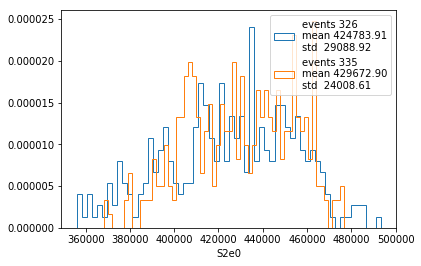

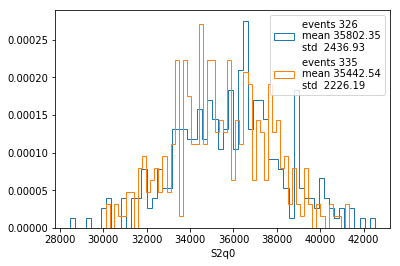

In [73]:
ut.hist_sample(sdf, (sela, selb), ilabels)

In [74]:
# track centered in the first and last part of the chamber
z0 = np.percentile(sdf.z_ave, 33.)
z1 = np.percentile(sdf.z_ave, 66.)
print(z0, z1)
sela =  (sdf.z_ave > 0.)   & (sdf.z_ave <= z0)
selb  = (sdf.z_ave < 600.) & (sdf.z_ave >= z1)

243.21078667290698 345.50226347257194


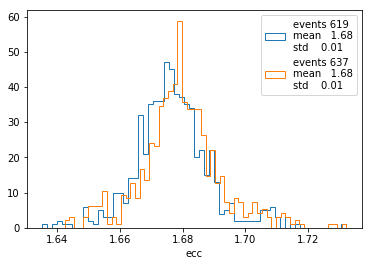

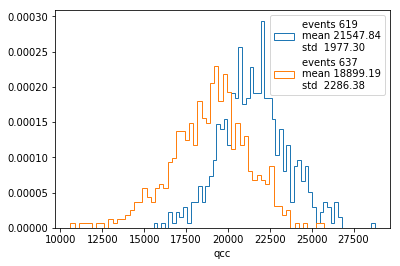

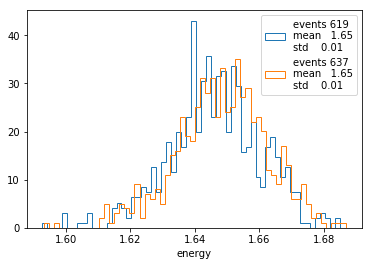

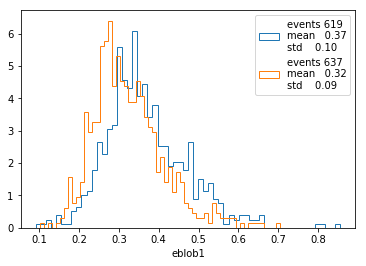

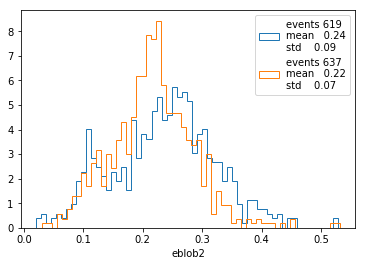

...

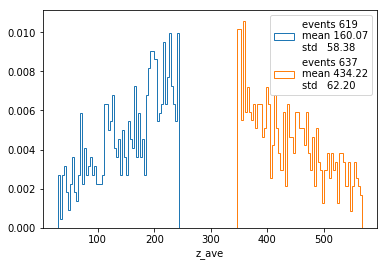

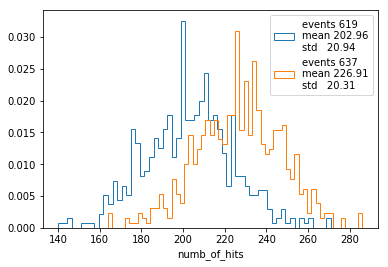

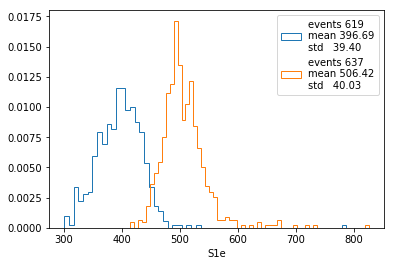

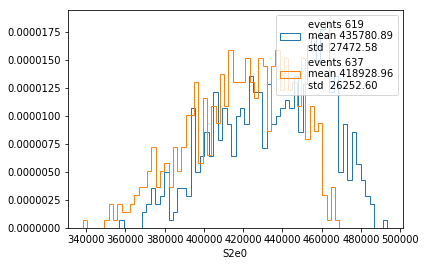

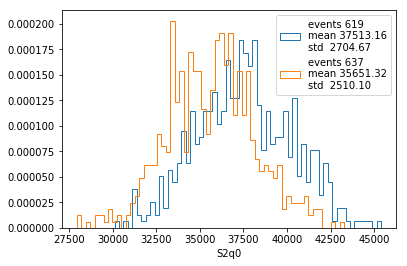

In [75]:
ut.hist_sample(sdf, (sela, selb), ilabels)

## Studies with Hits

In [79]:
ksel = (sdf.dz > 00.) & (sdf.dz < 100.)
evts =  sdf.event[ksel].values
ksel = np.isin(dfe.event.values, evts) & (dfe.Ec < 0.060)
#inspect_corr('Ec', dfevts[ksel], labels = ['dz', 'Z', 'X', 'Y', 'Q', 'E'], nbins_profile = 20, alpha = 0.05, c = 'blue');

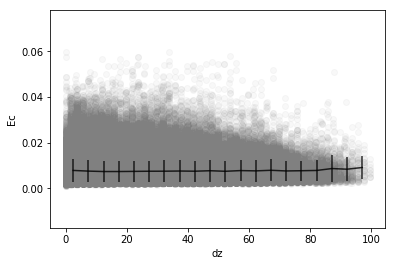

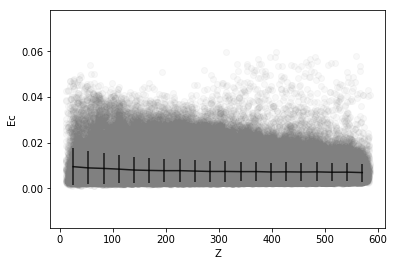

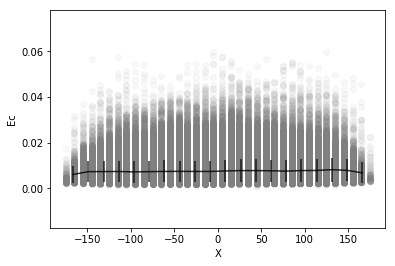

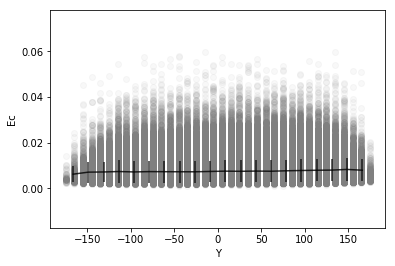

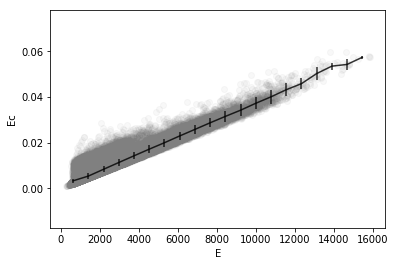

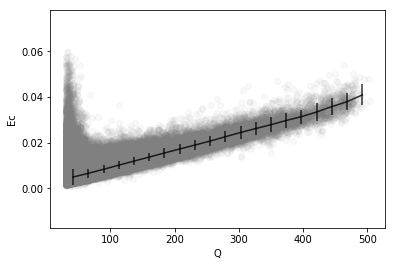

In [80]:
ut.inspect_corr('Ec', dfe[ksel], labels = ['dz', 'Z', 'X', 'Y', 'E', 'Q'], 
                nbins_profile = 20, alpha = 0.05, c = 'grey');

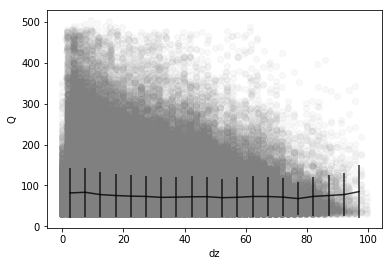

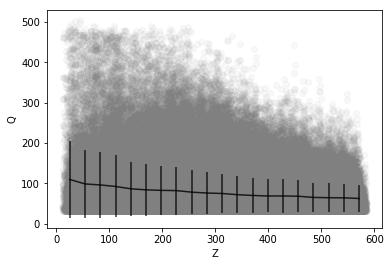

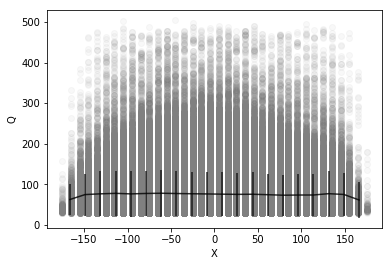

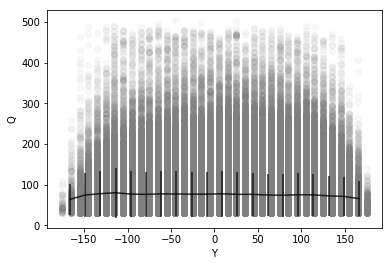

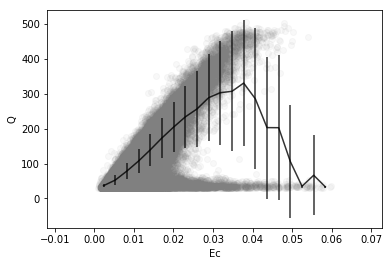

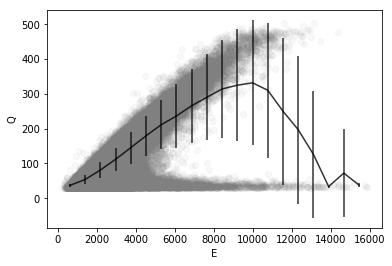

In [81]:
ut.inspect_corr('Q', dfe[ksel], labels = ['dz', 'Z', 'X', 'Y', 'Ec', 'E'], 
                nbins_profile = 20, alpha = 0.05, c = 'grey');

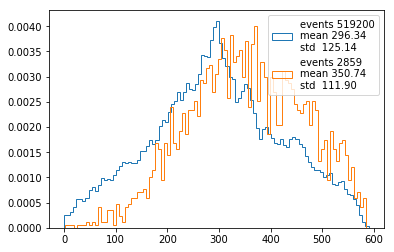

In [82]:
ksel = (dfe.Ec > 0.020) & (dfe.Q < 100)
ut.hist(dfe.Z, 100, density = True);
ut.hist(dfe[ksel].Z, density = True, fig = False);

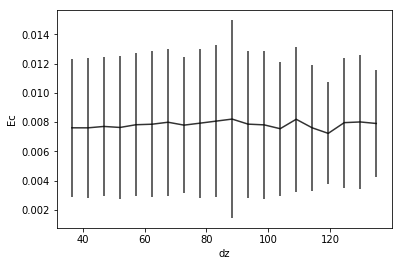

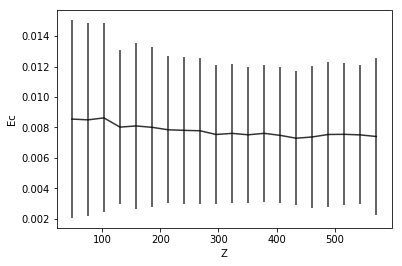

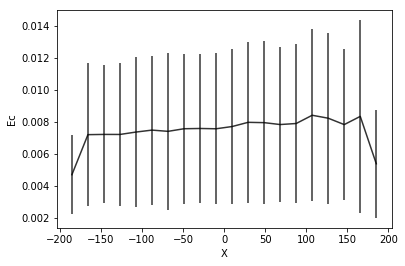

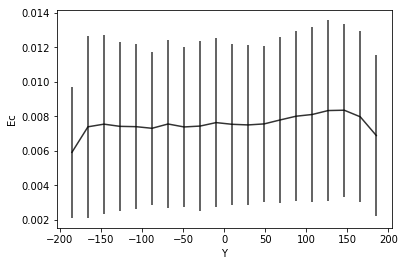

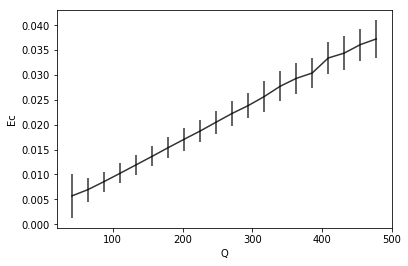

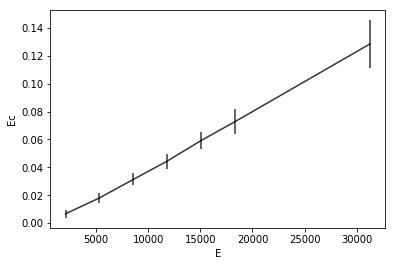

In [97]:
ut.inspect_hprof('Ec', dfe[ksel], labels = ['dz', 'Z', 'X', 'Y', 'Q', 'E'], 
              nbins_profile = 20, alpha = 0.05, c = 'blue');

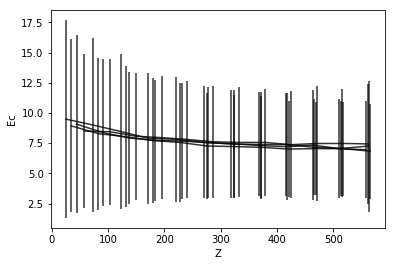

In [85]:
for i in range(4):
    z0 = np.percentile(dfe.dz, 25.*i)
    z1 = np.percentile(dfe.dz, 25.*(i+1))
    ksel = (dfe.dz >= z0) & (dfe.dz < z1)
    fig = False if i == 0 else True
    ut.hprofile(dfe[ksel].Z, 1000.*dfe[ksel].Ec, 'Z', 'Ec', fig = fig, nbins_profile = 12);

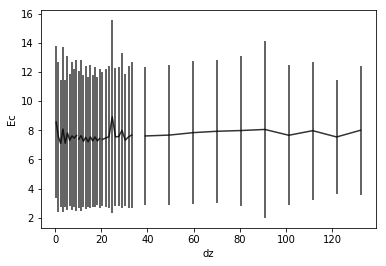

In [87]:
for i in range(4):
    z0 = np.percentile(dfe.dz, 25.*i)
    z1 = np.percentile(dfe.dz, 25.*(i+1))
    ksel = (dfe.dz >= z0) & (dfe.dz < z1)
    fig = False if i == 0 else True
    ut.hprofile(dfe[ksel].dz, 1000.*dfe[ksel].Ec, 'dz', 'Ec', fig = fig, nbins_profile = 10);

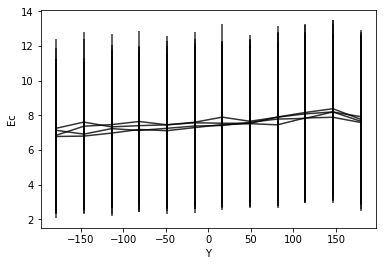

In [90]:
for i in range(4):
    z0 = np.percentile(dfe.dz, 25.*i)
    z1 = np.percentile(dfe.dz, 25.*(i+1))
    ksel = (dfe.dz >= z0) & (dfevts.dz < z1)
    fig = False if i == 0 else True
    ut.hprofile(dfe[ksel].Y, 1000.*dfe[ksel].Ec, 'Y', 'Ec', fig = fig, nbins_profile = 12);

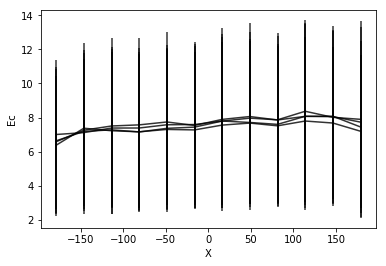

In [91]:
for i in range(4):
    z0 = np.percentile(dfe.dz, 25.*i)
    z1 = np.percentile(dfe.dz, 25.*(i+1))
    ksel = (dfe.dz >= z0) & (dfevts.dz < z1)
    fig = False if i == 0 else True
    ut.hprofile(dfe[ksel].X, 1000.*dfe[ksel].Ec, 'X', 'Ec', fig = fig, nbins_profile = 12);